# Unsupervised Learning - Project

In this Project, we are going to perform a full unsupervised learning machine learning project on a "Wholesale Data" dataset. The dataset refers to clients of a wholesale distributor. It includes the annual spending in monetary units (m.u.) on diverse product categories

[Kaggle Link](https://www.kaggle.com/datasets/binovi/wholesale-customers-data-set)

# Part I : EDA - Exploratory Data Analysis & Pre-processing

The given dataset seems to be a grocery sales dataset containing information about various products sold by a grocery store. To perform an exploratory data analysis (EDA) on this dataset, we can perform the following tasks:

- Data Import: Import the dataset into a statistical software tool such as Python or R.
- Data Cleaning: Check the dataset for any missing or incorrect data and clean the dataset accordingly. This may involve removing or imputing missing data or correcting any obvious errors.
Data Description: Generate summary statistics such as mean, median, and standard deviation for each column of the dataset. This will help in understanding the distribution of data in each column.
- Data Visualization: Create various visualizations such as histograms, box plots, scatter plots, and heatmaps to understand the relationships and trends between the different variables in the dataset. For example, we can create a scatter plot between the "Fresh" and "Milk" variables to see if there is any correlation between them.
- Outlier Detection: Check for any outliers in the dataset and determine whether they are valid or erroneous data points.
- Correlation Analysis: Calculate the correlation between different variables in the dataset to determine which variables are highly correlated and which ones are not. For example, we can calculate the correlation between "Grocery" and "Detergents_Paper" to see if there is any relationship between these two variables.
- Data Transformation: If necessary, transform the data by standardizing or normalizing the variables to make them comparable across different scales.
- Feature Selection: Identify the most important features or variables that contribute the most to the overall variance in the dataset. This can be done using various feature selection techniques such as principal component analysis (PCA) or random forest regression.

In [314]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.simplefilter('ignore')

In [315]:
# import data

data = pd.read_csv('data/Wholesale_Data.csv')
data.shape

(440, 8)

## EDA

Data set notes from https://archive.ics.uci.edu/dataset/292/wholesale+customers \

Channel - Horeca (1) (Hotel/Restaurant/Cafe) or Retail channel (2) (Nominal) \
Region - Lisnon, Oporto or Other (Nominal)\
Fresh -  annual spending (m.u.) on fresh products (Continuous)\
Milk - annual spending (m.u.) on milk products (Continuous)\
Grocery - annual spending (m.u.)on grocery products (Continuous)\
Frozen - annual spending (m.u.)on frozen products (Continuous)\
Detergents_Paper - annual spending (m.u.) on detergents and paper products (Continuous)\
Delicatessen - annual spending (m.u.)on and delicatessen products (Continuous)

In [316]:
data.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


Text(0.5, 1.0, 'Region Count')

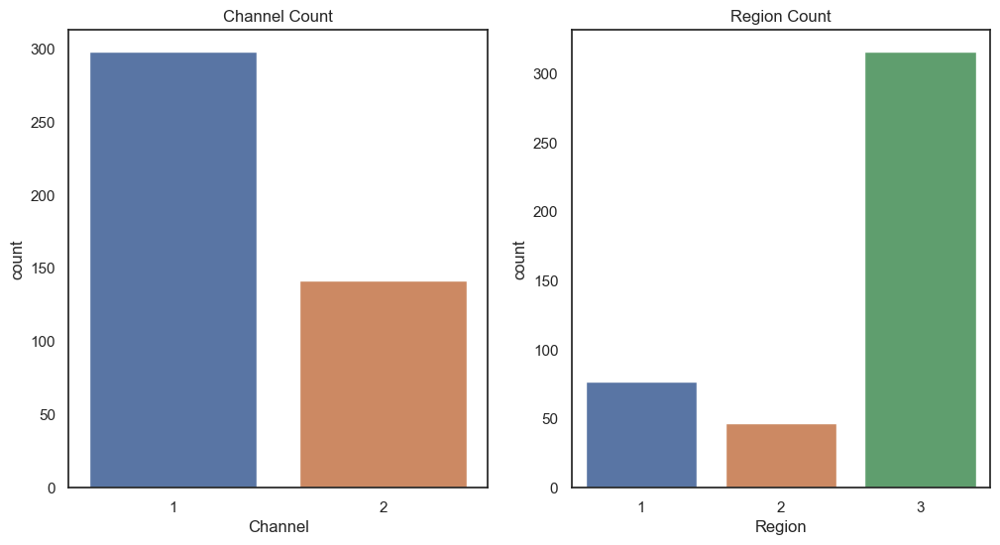

In [319]:
#checking the break down of the categorical data

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.set_style('white')


sns.countplot(x=data['Channel'], ax=axes[0])
axes[0].set_title('Channel Count')

sns.countplot(x=data['Region'], ax=axes[1])
axes[1].set_title('Region Count')


In [320]:
print(data['Channel'].unique())
print(data['Region'].unique())

[2 1]
[3 1 2]


While numerical in appearance, the Channel and Region features are clearly categorical. I have had much difficulty finding a straightforward answer about the use of categorical features with KMeans CLustering. While many of the articles, blogs and forums I have seen state that using numerically coded categorical features is fine for KMeans Clustering, many also say that while it is possible, it is less meaningful. So for the purpose of this project I have decided to exclude the Channel and Region Categories. 

In [321]:
#dropping categorical columns
num_df = data.drop(columns=['Channel', 'Region'], axis = 1)

In [322]:
num_df = num_df.rename(columns = {'Delicassen': 'Delicatessen'})

In [323]:
num_df.head(3)

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,12669,9656,7561,214,2674,1338
1,7057,9810,9568,1762,3293,1776
2,6353,8808,7684,2405,3516,7844


In [324]:
num_df.dtypes

Fresh               int64
Milk                int64
Grocery             int64
Frozen              int64
Detergents_Paper    int64
Delicatessen        int64
dtype: object

In [325]:
num_df.isna().sum()

Fresh               0
Milk                0
Grocery             0
Frozen              0
Detergents_Paper    0
Delicatessen        0
dtype: int64

It seems there are no missing values, no nulls, and no strange zeros. Now, to look at the data distribution.

In [326]:
#mean, median, mode for all columns
features = num_df.columns

for col in features:
    print(f"{col}: \nMean {num_df[col].mean():.2f}\nMedian {num_df[col].median():.2f}\nMode {list(num_df[col].mode())}")

Fresh: 
Mean 12000.30
Median 8504.00
Mode [3, 514, 3366, 7149, 8040, 9670, 18044]
Milk: 
Mean 5796.27
Median 3627.00
Mode [577, 659, 829, 899, 944, 1012, 1032, 1115, 1196, 1610, 1897, 2428, 2884, 3045, 3199, 3587, 3880, 4230, 5139]
Grocery: 
Mean 7951.28
Median 4755.50
Mode [683, 1493, 1563, 1664, 2062, 2405, 2406, 3600, 6536, 10391]
Frozen: 
Mean 3071.93
Median 1526.00
Mode [133, 364, 402, 425, 744, 779, 824, 830, 848, 937, 1285, 1619, 2540, 4324]
Detergents_Paper: 
Mean 2881.49
Median 816.50
Mode [3, 20, 56, 69, 70, 93, 96, 118, 153, 182, 210, 212, 227, 232, 256, 284, 311, 397, 483, 788, 811, 918, 955]
Delicatessen: 
Mean 1524.87
Median 965.50
Mode [3, 834]


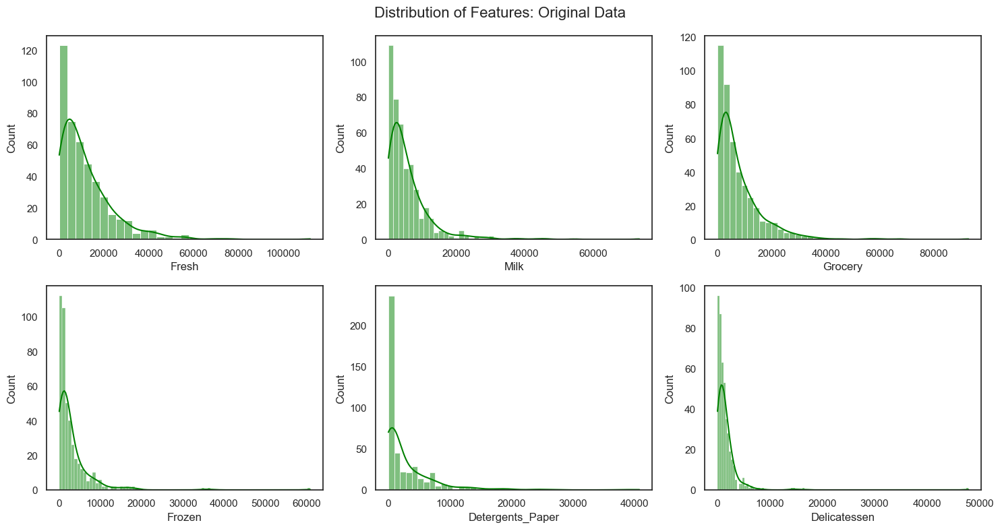

In [327]:
# distribution of the feature data

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

sns.histplot(data=num_df, x='Fresh', kde=True, ax=axes[0,0], color='green')
sns.histplot(data=num_df, x='Milk', kde=True, ax=axes[0,1], color='green')
sns.histplot(data=num_df, x='Grocery', kde=True, ax=axes[0,2], color='green')
sns.histplot(data=num_df, x='Frozen', kde=True, ax=axes[1,0], color='green')
sns.histplot(data=num_df, x='Detergents_Paper', kde=True, ax=axes[1,1], color='green')
sns.histplot(data=num_df, x='Delicatessen', kde=True, ax=axes[1,2], color='green')

fig.suptitle('Distribution of Features: Original Data', fontsize=16)
plt.tight_layout()

As you can see from the above charts there appear to be outliers in our abnormally distributed features. I will view the outliers further with a boxplot before deciding what to do with them. Scaling will also need to be done. But first, as we only have positive values, I will adjust the normality of the distribution with a log transformation.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Fresh'),
  Text(1, 0, 'Milk'),
  Text(2, 0, 'Grocery'),
  Text(3, 0, 'Frozen'),
  Text(4, 0, 'Detergents_Paper'),
  Text(5, 0, 'Delicatessen')])

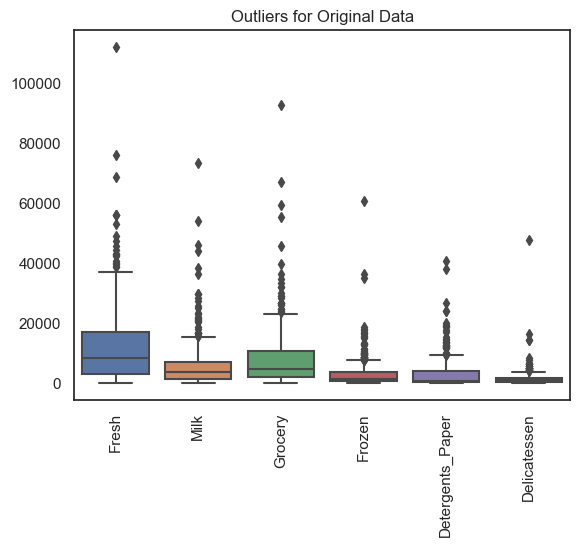

In [328]:
#boxplot for data prior to any data transformations
sns.boxplot(num_df).set_title('Outliers for Original Data')
plt.xticks(rotation=90)

#### Logarithmic Transformation

In [329]:
#Logarithmic transformation for distribution
df_log = np.log(num_df)

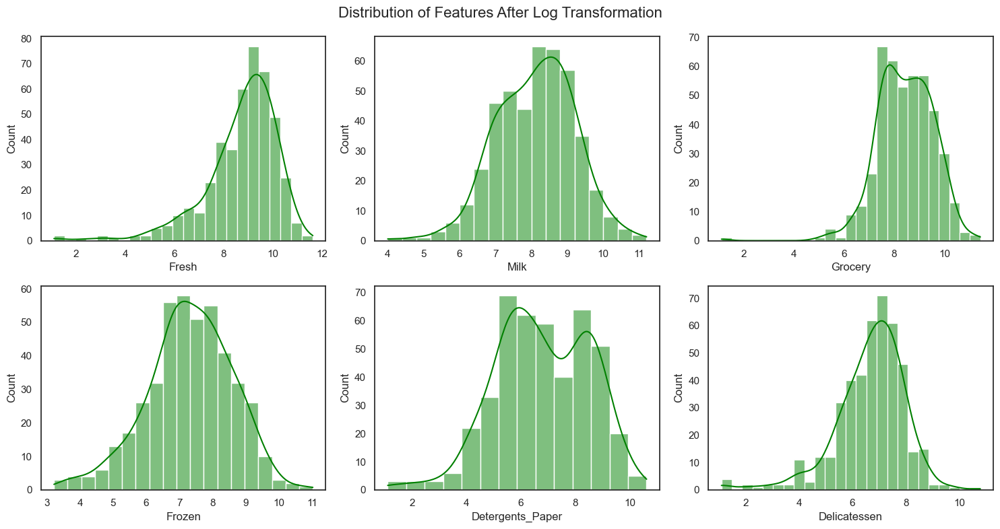

In [330]:
#feature distribution after logarithmic transformation

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

sns.histplot(data=df_log, x='Fresh', kde=True, ax=axes[0,0], color='green')
sns.histplot(data=df_log, x='Milk', kde=True, ax=axes[0,1], color='green')
sns.histplot(data=df_log, x='Grocery', kde=True, ax=axes[0,2], color='green')
sns.histplot(data=df_log, x='Frozen', kde=True, ax=axes[1,0], color='green')
sns.histplot(data=df_log, x='Detergents_Paper', kde=True, ax=axes[1,1], color='green')
sns.histplot(data=df_log, x='Delicatessen', kde=True, ax=axes[1,2], color='green')

fig.suptitle('Distribution of Features After Log Transformation', fontsize=16)
plt.tight_layout()

Looks Much better, but we should probably make sure with Shapiro-Wilkes.

In [331]:
#Shapiro Wilkes check for normal distribution
from scipy.stats import shapiro
features = num_df.columns

for feature in features:
    stat, p_value = shapiro(df_log[feature])
    print(f'Statistic: {stat}, p-value: {p_value}')
    
    if p_value > 0.05:
        print('Data looks normally distributed')
    else:
        print('Data does not look normally distributed')

Statistic: 0.8900659084320068, p-value: 3.303972117390341e-17
Data does not look normally distributed
Statistic: 0.9940831661224365, p-value: 0.08530066162347794
Data looks normally distributed
Statistic: 0.9645652174949646, p-value: 8.116742833408352e-09
Data does not look normally distributed
Statistic: 0.9900306463241577, p-value: 0.004433612339198589
Data does not look normally distributed
Statistic: 0.9816250801086426, p-value: 2.2663296476821415e-05
Data does not look normally distributed
Statistic: 0.9296266436576843, p-value: 1.5756390333090953e-13
Data does not look normally distributed


So log tranformation did not do an ideal job in this case, so we will have to try again with the Box-Cox method. Take 2!!

#### Box-Cox Transformation

In [332]:
#transformation with box-cox method
from scipy.stats import boxcox
bc_df = num_df.copy()

num_features = len(num_df.columns)
for col in features:
    tdata, _ = boxcox(num_df[col])
    bc_df[col] = tdata
bc_df.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,51.736919,12.670296,16.694342,6.887991,10.154313,15.470232
1,42.989031,12.699553,17.444169,10.638490,10.494584,16.620941
2,41.571828,12.500943,16.745021,11.254315,10.602565,23.790243
3,52.490385,9.068054,14.932092,13.308825,7.587652,16.649068
4,62.025081,11.620137,16.540472,12.253988,9.499037,21.583731


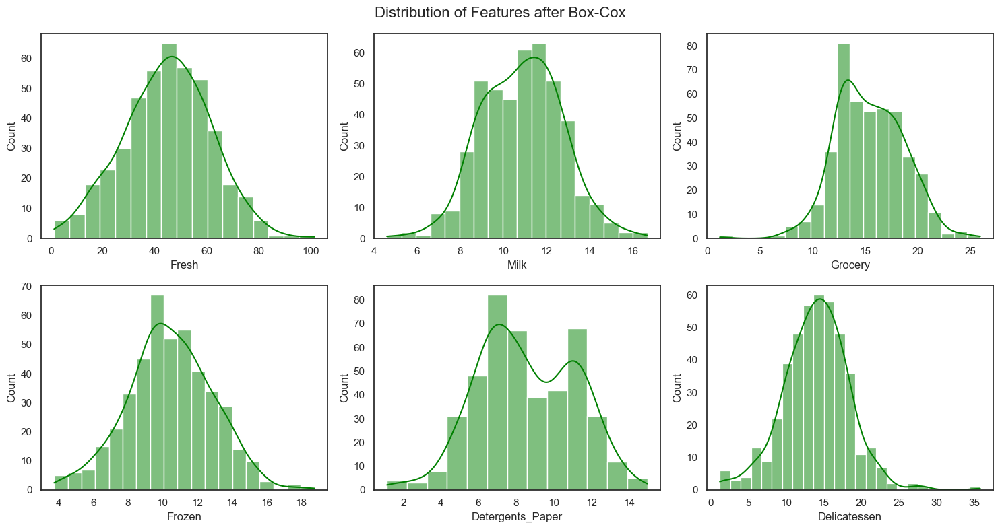

In [333]:
#feature distribution after Box-Cox transformation

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

sns.histplot(data=bc_df, x='Fresh', kde=True, ax=axes[0,0], color='green')
sns.histplot(data=bc_df, x='Milk', kde=True, ax=axes[0,1], color='green')
sns.histplot(data=bc_df, x='Grocery', kde=True, ax=axes[0,2], color='green')
sns.histplot(data=bc_df, x='Frozen', kde=True, ax=axes[1,0], color='green')
sns.histplot(data=bc_df, x='Detergents_Paper', kde=True, ax=axes[1,1], color='green')
sns.histplot(data=bc_df, x='Delicatessen', kde=True, ax=axes[1,2], color='green')

fig.suptitle('Distribution of Features after Box-Cox', fontsize=16)
plt.tight_layout()

Checking again with Shapiro-Wilkes...

In [99]:
#Shapiro Wilkes
from scipy.stats import shapiro
features = bc_df.columns

for feature in features:
    stat, p_value = shapiro(bc_df[feature])
    print(f'Statistic: {stat}, p-value: {p_value}')
    
    if p_value > 0.05:
        print('Data looks normally distributed')
    else:
        print('Data does not look normally distributed')


Statistic: 0.9974440932273865, p-value: 0.7375574111938477
Data looks normally distributed
Statistic: 0.9969488382339478, p-value: 0.5841630697250366
Data looks normally distributed
Statistic: 0.9891613125801086, p-value: 0.0024241642095148563
Data does not look normally distributed
Statistic: 0.9972368478775024, p-value: 0.673468291759491
Data looks normally distributed
Statistic: 0.9852079153060913, p-value: 0.0001853277935879305
Data does not look normally distributed
Statistic: 0.9818688631057739, p-value: 2.5985384127125144e-05
Data does not look normally distributed


Distribution has improved! Onto scaling with MinMaxScaler as it is less sensitive to outliers than StandardScaler.

#### Scaling with MinMax Scaler

In [100]:
#MinMax Scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(bc_df)
scaled_df=pd.DataFrame(scaled_df, columns=features)

In [101]:
scaled_df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,0.434284,0.517687,0.575016,0.446240,0.536239,0.369972
std,0.166731,0.153388,0.129525,0.162440,0.187391,0.126232
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.316976,0.403088,0.479005,0.351230,0.395652,0.290764
50%,0.441956,0.522873,0.568877,0.440634,0.517502,0.376110
75%,0.552187,0.623106,0.670242,0.553142,0.697254,0.448589
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Fresh'),
  Text(1, 0, 'Milk'),
  Text(2, 0, 'Grocery'),
  Text(3, 0, 'Frozen'),
  Text(4, 0, 'Detergents_Paper'),
  Text(5, 0, 'Delicatessen')])

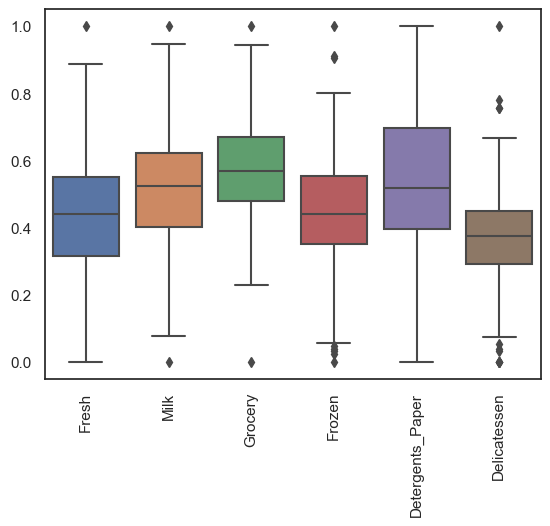

In [102]:
#checking outliers with a boxplot after transformation and scaling
sns.boxplot(data=scaled_df)
plt.xticks(rotation=90)

While there are clearly outliers within this data and if I had means to verify the origin of this data I would investigate further to try to discern whether they were valid entries or not. It is possible that one of our clients spent that much money on the corresponding items, in which case it would be incorrect to removed them. My dilema is that KMeans Clustering is sensitive to outliers. I will try to run both scenarios (with the outliers and with outliers removed). I apologize in advanced, there sure are a lot of visualizations down there.

Lets create our secondary dataset by removing some outliers using the IQR.

#### IQR Outlier 

In [125]:
scaled_df_copy = scaled_df.copy()

for col in features:
    q1 = scaled_df[col].quantile(0.25)
    q3 = scaled_df[col].quantile(0.75)
    IQR = q3 - q1
    
    lower_fence = q1 - (1.5 * IQR)
    upper_fence = q3 + (1.5 * IQR)

    # Select rows that are not outliers
    non_outliers = ~((scaled_df[col] < lower_fence) | (scaled_df[col] > upper_fence))
    
    scaled_df_copy = scaled_df_copy[non_outliers]

scaled_df_OR = scaled_df_copy.reset_index(drop=True)  #new dataset with outliers removed is scaled_df_OR   OR - outliers removed

In [120]:
scaled_df.shape

(440, 6)

In [121]:
scaled_df_OR.shape

(418, 6)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Fresh'),
  Text(1, 0, 'Milk'),
  Text(2, 0, 'Grocery'),
  Text(3, 0, 'Frozen'),
  Text(4, 0, 'Detergents_Paper'),
  Text(5, 0, 'Delicatessen')])

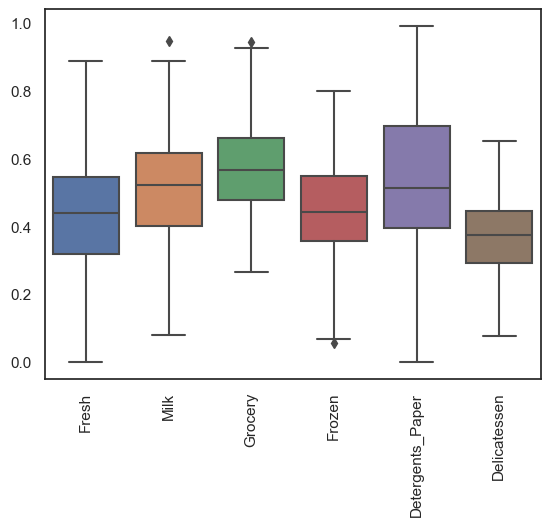

In [123]:
#checking outliers with a boxplot after outlier removal
sns.boxplot(data=scaled_df_OR)
plt.xticks(rotation=90)

We can now use some more visualizations to look at the relationships between our features.

#### PairPlots

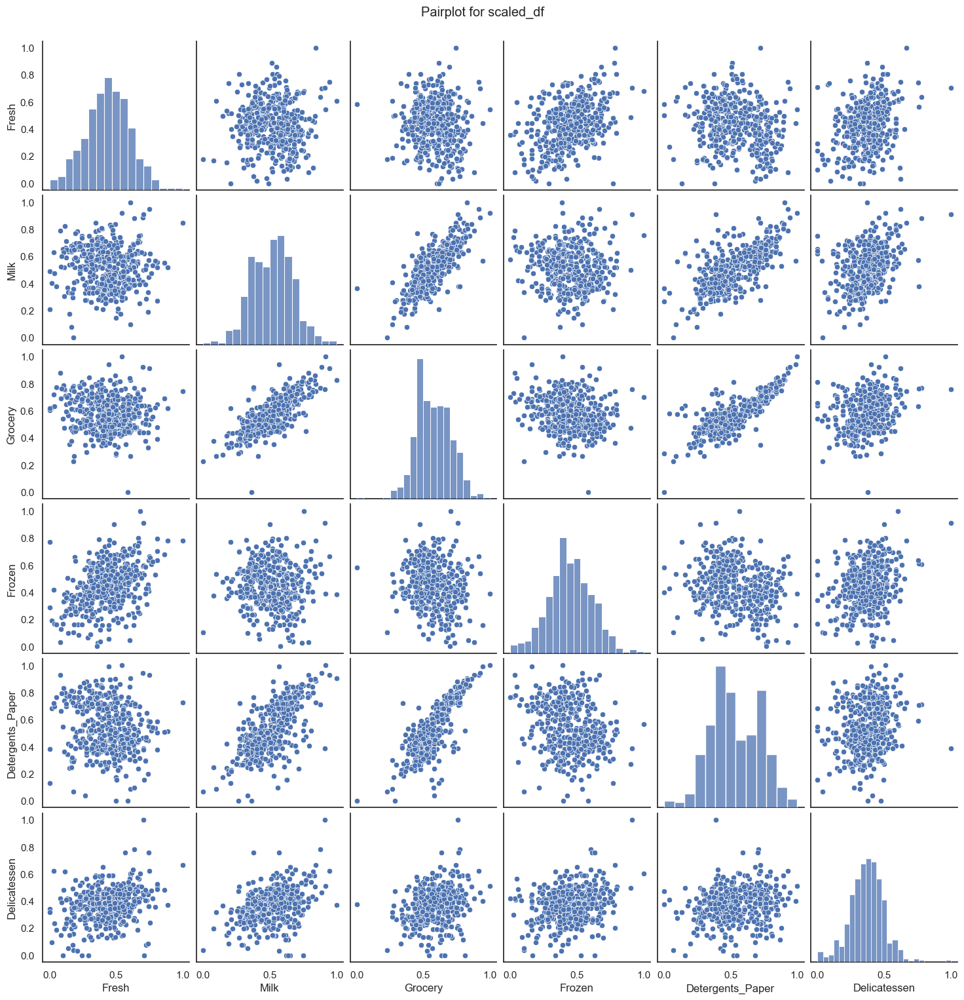

In [124]:
#pairplot for original data
pairplot = sns.pairplot(scaled_df)
pairplot.fig.suptitle("Pairplot for scaled_df", y=1.02)
plt.show()

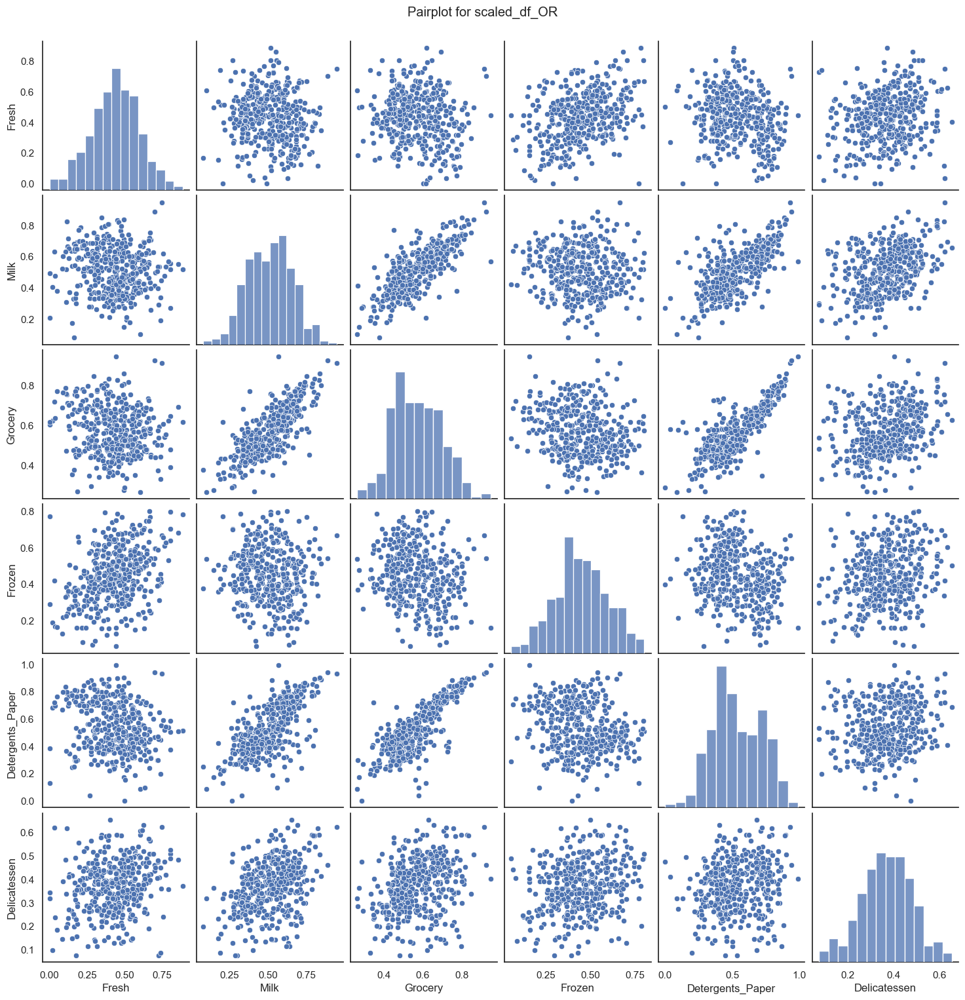

In [126]:
#pairplot for scaled_df)OR
pairplot = sns.pairplot(scaled_df_OR)
pairplot.fig.suptitle("Pairplot for scaled_df_OR", y=1.02)
plt.show()

#### Correlation and HeatMaps

In [127]:
#Correlation Matrix for scaled_df
scaled_cm = scaled_df.corr()
scaled_cm

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
Fresh,1.000000,-0.023114,-0.106490,0.409108,-0.180152,0.274444
Milk,-0.023114,1.000000,0.777832,-0.044705,0.684856,0.384415
Grocery,-0.106490,0.777832,1.000000,-0.161393,0.818136,0.283831
Frozen,0.409108,-0.044705,-0.161393,1.000000,-0.219160,0.277641
Detergents_Paper,-0.180152,0.684856,0.818136,-0.219160,1.000000,0.178416
Delicatessen,0.274444,0.384415,0.283831,0.277641,0.178416,1.000000


In [128]:
#Correlation Matrix for scaled_df_OR
scaled_cm_OR = scaled_df_OR.corr()
scaled_cm_OR

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
Fresh,1.000000,-0.079240,-0.151748,0.374647,-0.208305,0.195253
Milk,-0.079240,1.000000,0.777327,-0.080196,0.693005,0.401132
Grocery,-0.151748,0.777327,1.000000,-0.176659,0.818547,0.277834
Frozen,0.374647,-0.080196,-0.176659,1.000000,-0.209487,0.224260
Detergents_Paper,-0.208305,0.693005,0.818547,-0.209487,1.000000,0.156670
Delicatessen,0.195253,0.401132,0.277834,0.224260,0.156670,1.000000


Text(0.5, 1.0, 'Correlation Heat Map for scaled_df')

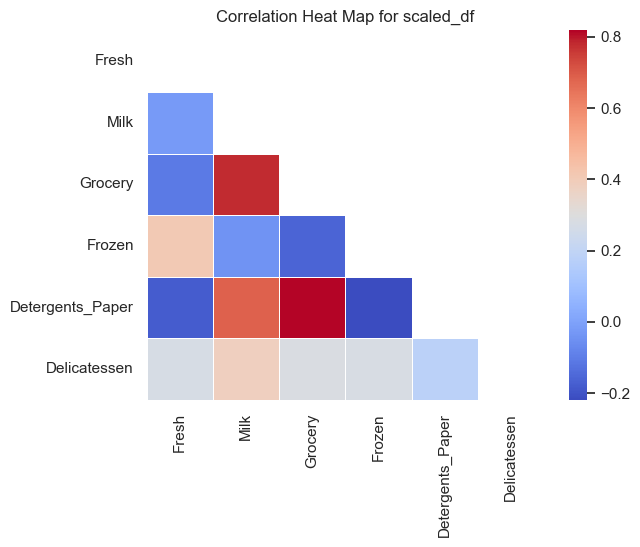

In [129]:
#Heatmap to view correlations
mask = np.triu(np.ones_like(scaled_cm, dtype=bool))
sns.heatmap(scaled_cm, annot=True, mask=mask, cmap="coolwarm",linewidths=.5, xticklabels=features, yticklabels=scaled_cm.columns)
plt.title('Correlation Heat Map for scaled_df')

Text(0.5, 1.0, 'Correlation Heat Map for scaled_df_OR')

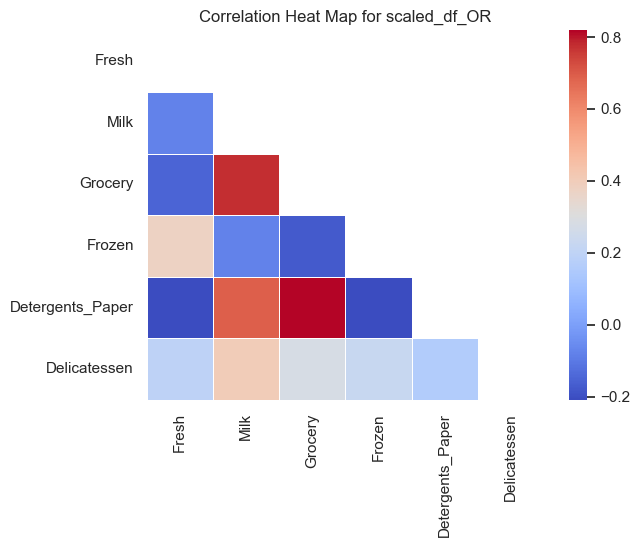

In [130]:
#Heatmap to view correlations
mask = np.triu(np.ones_like(scaled_cm_OR, dtype=bool))
sns.heatmap(scaled_cm_OR, annot=True, mask=mask, cmap="coolwarm",linewidths=.5, xticklabels=features, yticklabels=scaled_cm_OR.columns)
plt.title('Correlation Heat Map for scaled_df_OR')

We can see from the above pairplots, correlation matrices and heatmaps there are some noteable positive correlations between some of the features on both the original data and the data with outliers removed respectivley. \
Grocery and Detergents_Paper    0.818    0.818\
Milk and Grocery                0.777    0.777\
Milk and Detergents_Paper       0.685    0.693

Some sources referenced while completing my EDA.

https://s3.amazonaws.com/assets.datacamp.com/production/course_10628/slides/chapter3.pdf \
https://sigmamagic.com/blogs/how-do-i-transform-data-to-normal-distribution/ \
https://medium.com/@evgen.ryzhkov/5-stages-of-data-preprocessing-for-k-means-clustering-b755426f9932

# Part II - KMeans Clustering

The objective of the analysis is to group similar products together into clusters based on their attributes such as fresh, milk, grocery, frozen, detergents_paper, and delicatessen. To perform the k-means clustering analysis, you will need to pre-process the dataset, determine the optimal number of clusters, initialize the centroids, assign data points to clusters, update the centroids, and repeat until convergence.

As the preporcessing has already been accomplished in the first part, we will start with determining the optimal number of clusters by using the Elbow Rule in a distortion plot.

#### Elbow Rule and Distortion Plots

In [132]:
#function for using KMeans to create plots for the Elbow Rule

from sklearn.cluster import KMeans

def plot_distortion(X, max_clusters = 10):
    distortions = []
    for i in range(1, max_clusters +1):
        km = KMeans(n_clusters=i,
                    init='k-means++',
                    n_init=10,
                    random_state=0)
        km.fit(X)
        distortions.append(km.inertia_)
        
    plt.plot(range(1,max_clusters +1), distortions, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show() 

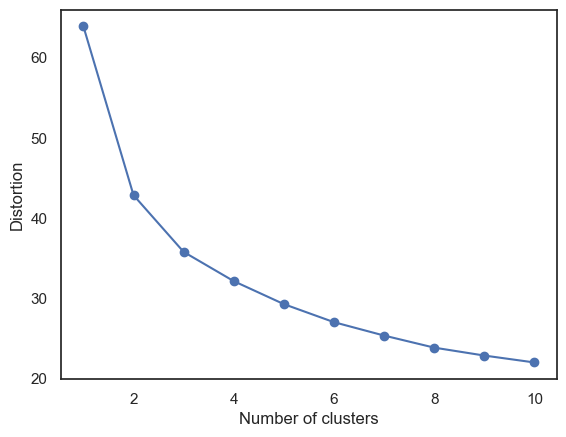

In [133]:
# Distortion plot for scaled_df
plot_distortion(scaled_df, max_clusters=10)

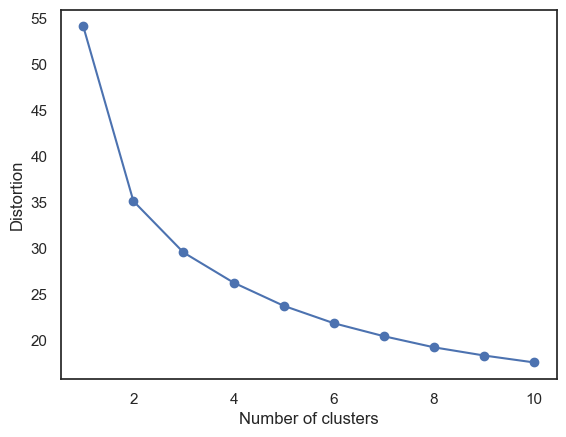

In [134]:
# Distortion plot for scaled_df_OR
plot_distortion(scaled_df_OR,max_clusters=10)

These plots don't seem to have much of an indisputable elbow. Things seem to even out somewhere between 2 and 4-5. In order to get more incite on our lack of elbow, I will also refer to the silhouette method as suggested here.

https://medium.com/analytics-vidhya/how-to-determine-the-optimal-k-for-k-means-708505d204eb

#### Silhouette Score

In [140]:
# Silhouette score for scaled_df

from sklearn.metrics import silhouette_score

sil_score = []
kmax = 10

for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(scaled_df)
  labels = kmeans.labels_
  sil_score.append(silhouette_score(scaled_df, labels, metric = 'euclidean'))

In [142]:
# Silhouette score for scaled_df_OR

from sklearn.metrics import silhouette_score

sil_score_OR = []
kmax_OR = 10

for k in range(2, kmax_OR+1):
  kmeans_OR = KMeans(n_clusters = k).fit(scaled_df_OR)
  labels_OR = kmeans_OR.labels_
  sil_score_OR.append(silhouette_score(scaled_df_OR, labels_OR, metric = 'euclidean'))

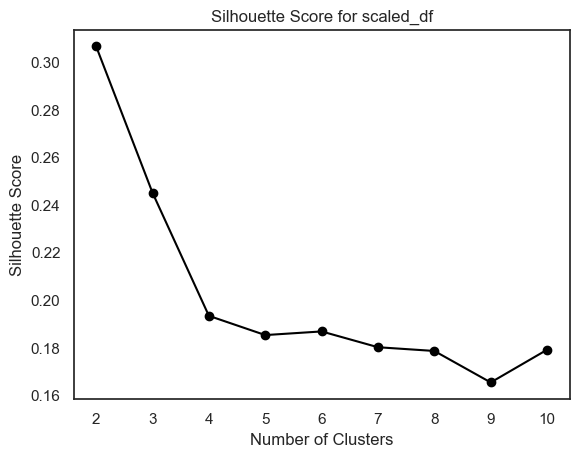

In [143]:
# Plot silhouette scores for scaled_df
plt.plot(range(2, kmax + 1), sil_score, marker='o', color = 'black')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for scaled_df')
plt.show()

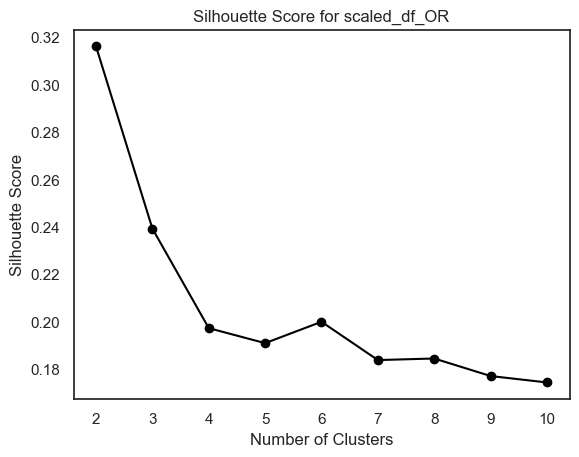

In [145]:
# Plot silhouette scores for scaled_df_OR
plt.plot(range(2, kmax + 1), sil_score_OR, marker='o', color = 'black')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for scaled_df_OR')
plt.show()

For a silhouette score a the higher the number the better. So it would seem that 2 is our best value for k. Maybe 3 isn't terrible either? We can try both.

### KMeans Modelling

#### 2 Clusters

In [148]:
#running KMeans model with 2 Clusters
km_2 = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=9)

cluster_m2 = km_2.fit_predict(scaled_df)
cluster_df2 = pd.concat([scaled_df, pd.Series(cluster_m2, name='Cluster')], axis=1)

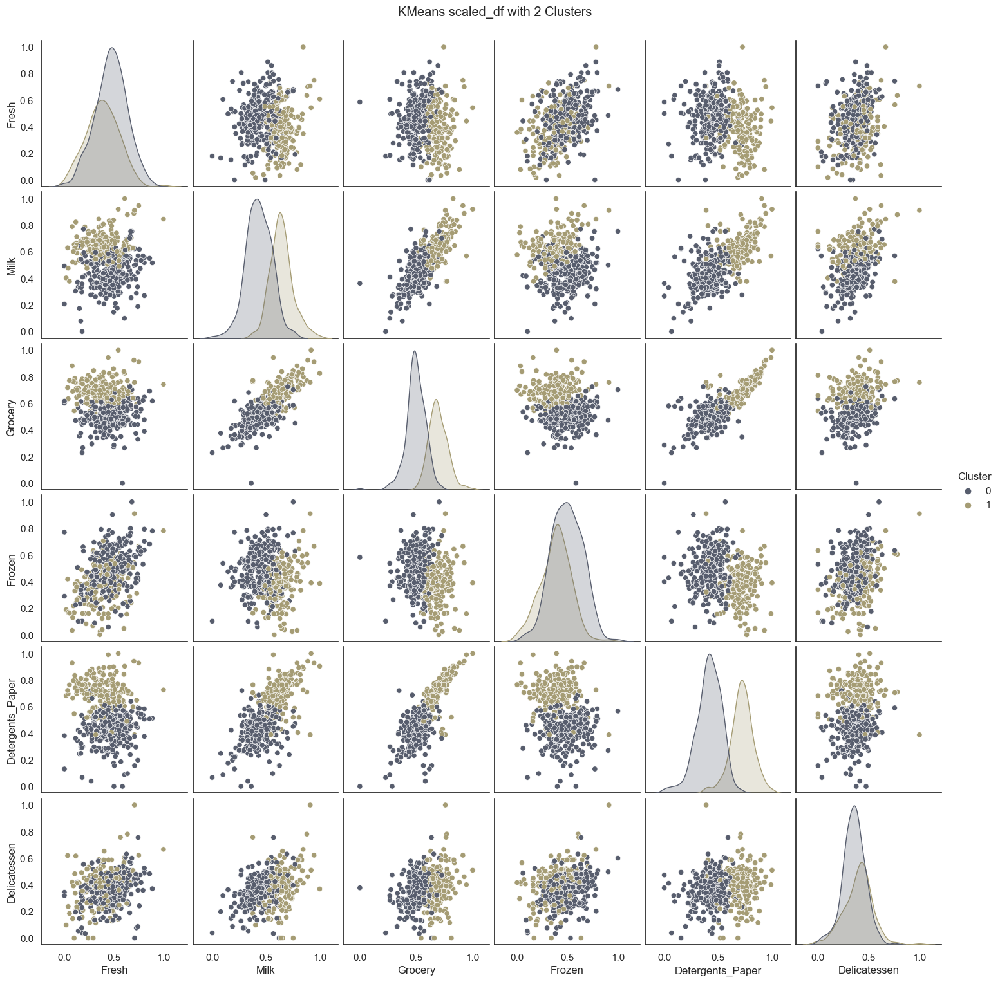

In [334]:
#Visualizing the Clusters
custom_palette = sns.color_palette("cividis", n_colors=2)
sns.pairplot(cluster_df2, hue = 'Cluster', palette=custom_palette)
plt.suptitle('KMeans scaled_df with 2 Clusters', y=1.02, ha='center') 
plt.show()

In [151]:
# counts in each category
cluster_df2['Cluster'].value_counts()

Cluster
0    261
1    179
Name: count, dtype: int64

In [152]:
#running KMeans model with 2 Clusters on scaled_df_OR

cluster_m2_OR = km_2.fit_predict(scaled_df_OR)
cluster_df2_OR = pd.concat([scaled_df_OR, pd.Series(cluster_m2_OR, name='Cluster')], axis=1)

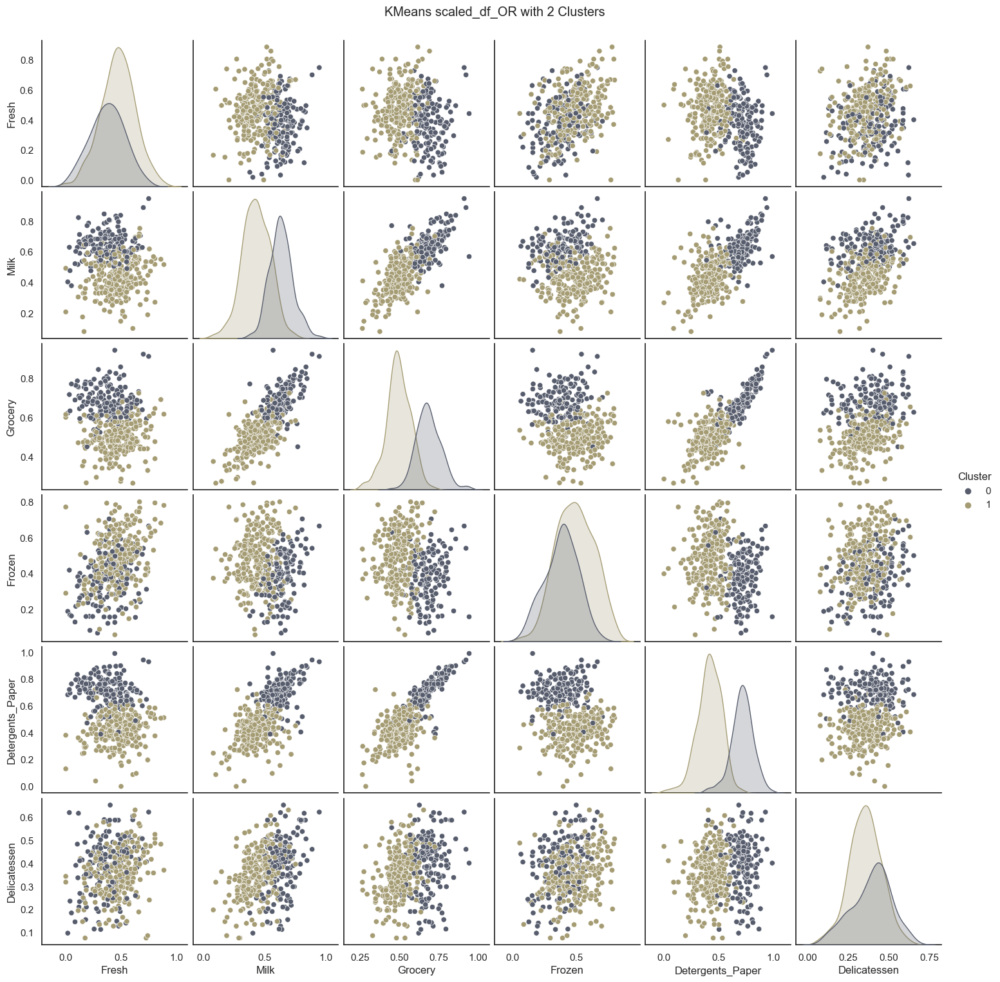

In [175]:
#Visualizing the Clusters
custom_palette = sns.color_palette("cividis", n_colors=2)
sns.pairplot(cluster_df2_OR, hue = 'Cluster', palette=custom_palette)
plt.suptitle('KMeans scaled_df_OR with 2 Clusters', y=1.02, ha='center') 
plt.show()

In [154]:
# counts in each category
cluster_df2_OR['Cluster'].value_counts()

Cluster
1    252
0    166
Name: count, dtype: int64

#### 3 Clusters

In [157]:
#model set up for 3 clusters with KMeans for scaled_df
km_3 = KMeans(n_clusters=3, init='k-means++', n_init=10, random_state=9)

clusters_m3 = km_3.fit_predict(scaled_df)
clustered_df3 = pd.concat([scaled_df, pd.Series(clusters_m3, name='Cluster')], axis=1)

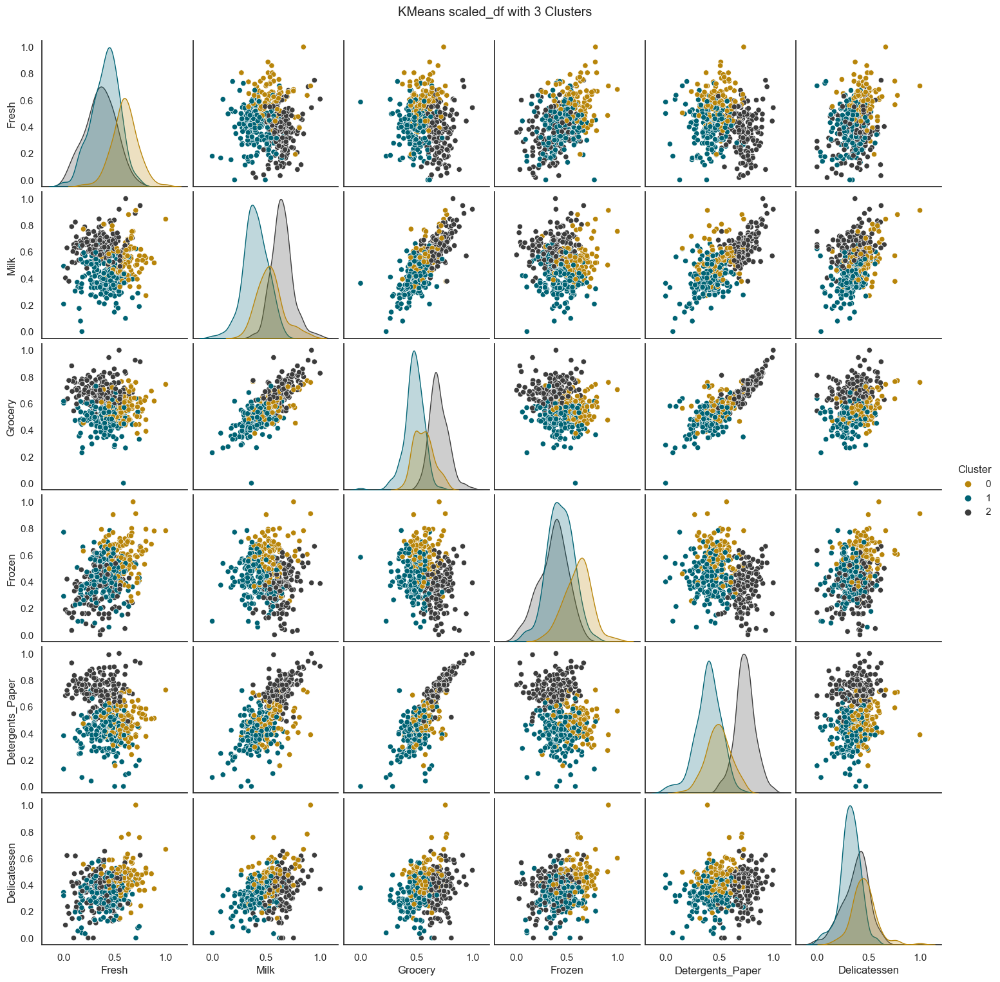

In [335]:
#Visualizing the Clusters
set_palette = sns.color_palette("dark", 10)
custom_palette = [set_palette[8], set_palette[9], set_palette[7]]
sns.pairplot(clustered_df3, hue='Cluster', palette=custom_palette)
plt.suptitle('KMeans scaled_df with 3 Clusters', y=1.02, ha='center') 
plt.show()

In [158]:
#model set up for 3 clusters with KMeans for scaled_df_OR

clusters_m3_OR = km_3.fit_predict(scaled_df_OR)
clustered_df3_OR = pd.concat([scaled_df_OR, pd.Series(clusters_m3_OR, name='Cluster')], axis=1)

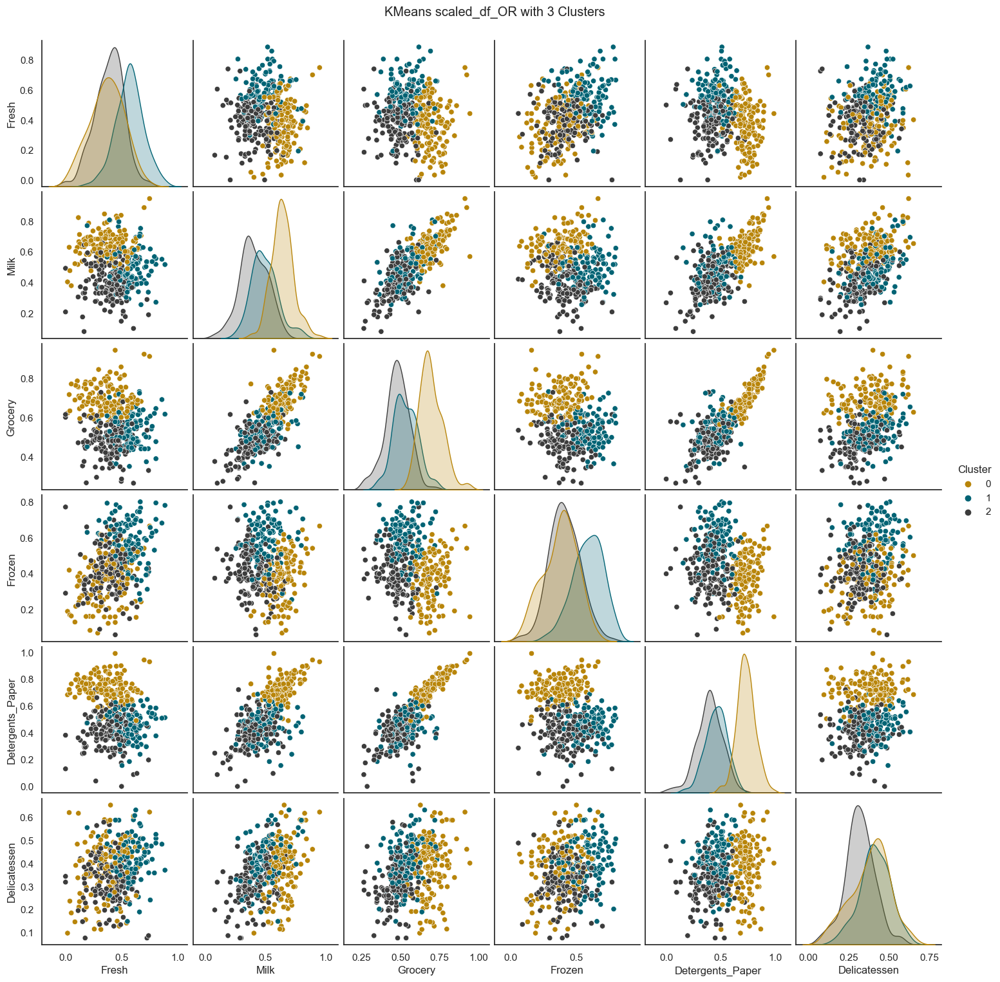

In [336]:
#Visualizing the Clusters
set_palette = sns.color_palette("dark", 10)
custom_palette = [set_palette[8], set_palette[9], set_palette[7]]
sns.pairplot(clustered_df3_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('KMeans scaled_df_OR with 3 Clusters', y=1.02, ha='center') 
plt.show()

It is much easier to see the different clusters on most of the groupings when there are only two clusters. Especially when you're looking at our 3 combinations with the highest correlation. (Grocery and Detergents_Paper, Milk and Grocery and Milk and Detergents_Paper.)\

From a quick glance, 3 clusters does not seem to do anything to clarify the data.

# Part III - Hierarchical Clustering 

Hierarchical clustering is a popular unsupervised machine learning algorithm that is used to identify patterns and group similar data points together in a hierarchy. The algorithm works by iteratively merging or splitting clusters based on a similarity measure until a dendrogram is formed.

To perform hierarchical clustering analysis, you will need to pre-process the dataset, determine the optimal number of clusters using techniques such as dendrogram.

In [187]:
#We can start this section off with out previously prepared data
scaled_df.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,0.503006,0.667729,0.625853,0.209882,0.651772,0.412310
1,0.415768,0.670149,0.656101,0.459175,0.676366,0.445609
2,0.401635,0.653724,0.627898,0.500109,0.684170,0.653077
3,0.510520,0.369822,0.554765,0.636671,0.466264,0.446423
4,0.605605,0.580881,0.619646,0.566556,0.604411,0.589224


In [188]:
scaled_df_OR.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,0.503006,0.667729,0.625853,0.209882,0.651772,0.412310
1,0.415768,0.670149,0.656101,0.459175,0.676366,0.445609
2,0.401635,0.653724,0.627898,0.500109,0.684170,0.653077
3,0.510520,0.369822,0.554765,0.636671,0.466264,0.446423
4,0.605605,0.580881,0.619646,0.566556,0.604411,0.589224


### Creating Dendrograms

#### Dendograms for scaled_df

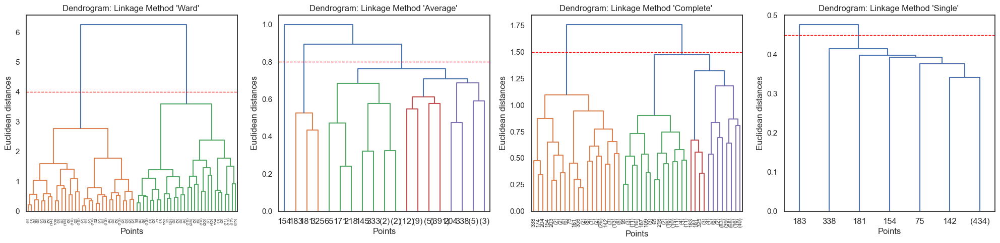

In [194]:
import scipy.cluster.hierarchy as sch

def plot_dendrogram(X, method='ward', max_d=None, ax=None, threshold=None):
    dendrogram = sch.dendrogram(sch.linkage(X, method=method), truncate_mode='level', p=5, color_threshold=max_d, ax=ax)
    ax.axhline(y=threshold, label=f'threshold_{method}', linestyle="--", color='red', lw=1)
    ax.set_title(f"Dendrogram: Linkage Method '{method.capitalize()}' ")
    ax.set_ylabel("Euclidean distances")
    ax.set_xlabel('Points')


fig, axes = plt.subplots(1, 4, figsize=(20, 5))

plot_dendrogram(scaled_df, method='ward', ax=axes[0], threshold=4)
plot_dendrogram(scaled_df, method='average', ax=axes[1], threshold=0.8)
plot_dendrogram(scaled_df, method='complete', ax=axes[2], threshold=1.5)
plot_dendrogram(scaled_df, method='single', ax=axes[3], threshold=0.45)

plt.tight_layout()

# Show the plot
plt.show()

#### Dendrograms for scaled_df_OR

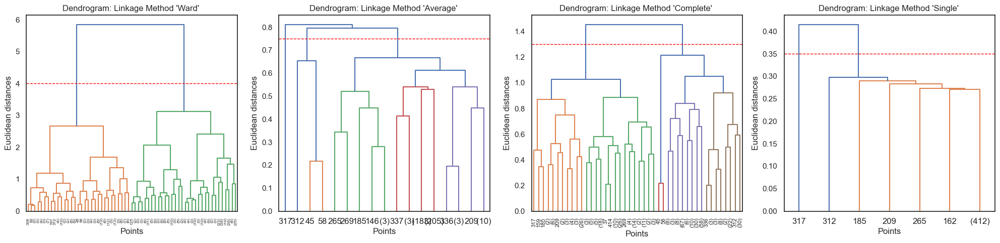

In [196]:
import scipy.cluster.hierarchy as sch

def plot_dendrogram(X, method='ward', max_d=None, ax=None, threshold=None):
    dendrogram = sch.dendrogram(sch.linkage(X, method=method), truncate_mode='level', p=5, color_threshold=max_d, ax=ax)
    ax.axhline(y=threshold, label=f'threshold_{method}', linestyle="--", color='red', lw=1)
    ax.set_title(f"Dendrogram: Linkage Method '{method.capitalize()}' ")
    ax.set_ylabel("Euclidean distances")
    ax.set_xlabel('Points')


fig, axes = plt.subplots(1, 4, figsize=(20, 5))

plot_dendrogram(scaled_df_OR, method='ward', ax=axes[0], threshold=4)
plot_dendrogram(scaled_df_OR, method='average', ax=axes[1], threshold=0.75)
plot_dendrogram(scaled_df_OR, method='complete', ax=axes[2], threshold=1.3)
plot_dendrogram(scaled_df_OR, method='single', ax=axes[3], threshold=0.35)

plt.tight_layout()

# Show the plot
plt.show()

When looking at dendrograms and where to cut through them there are a lot of different perspectives about what is optimal. As expected the most common answer is 'It depends'. However I did find a reasonably understandable explanation at the link below and will be taking that approach to setting my thresholds. I have added red lines to show where these thresholds are for each method type.

https://towardsdatascience.com/hierarchical-clustering-explain-it-to-me-like-im-10-f949f8f3f80

So with this approach, the optimal amount of clusters is 2 for each method or 3 if you want to include the outlier on the 'Average' dendrogram, which lines up with clustering on the KMeans models. We can try both. The ward method is less sensitive to outlier than the other methods. So we will proceed with that one

### Agglomerative Clustering

#### 2 Clusters

In [199]:
#fitting model to scaled_df, Ward method with 2 clusters
from sklearn.cluster import AgglomerativeClustering

ac_2 = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters = 2)
ward_2 = ac_2.fit_predict(scaled_df)

In [200]:
ward2_df = scaled_df.copy()
ward2_df['Cluster']=ward_2

Plotting clusters for Ward Method with 2 Clusters for scaled_df

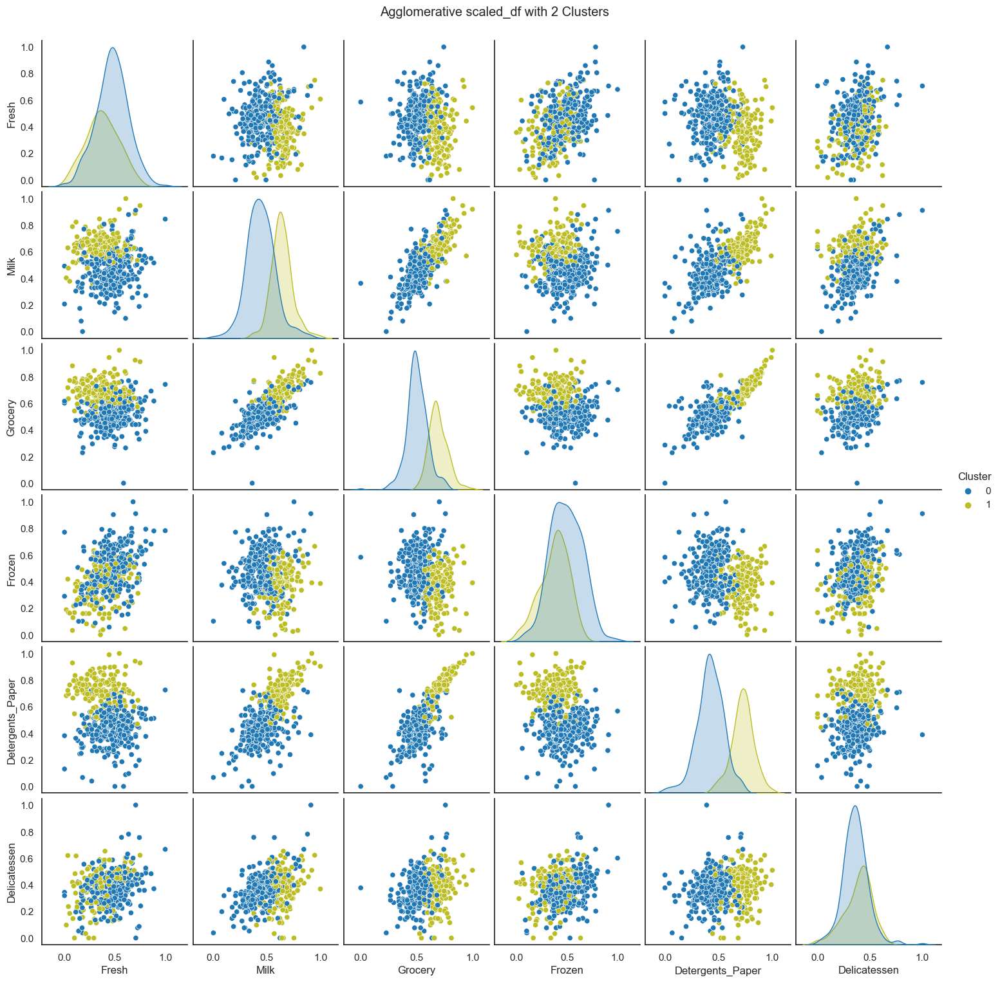

In [337]:
set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[0], set_palette[8]]
sns.pairplot(ward2_df, hue='Cluster', palette=custom_palette)
plt.suptitle('Agglomerative scaled_df with 2 Clusters', y=1.02, ha='center') 
plt.show()

In [211]:
#fitting model to scaled_df_OR, Ward method with 2 clusters
from sklearn.cluster import AgglomerativeClustering

ac_2 = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters = 2)
ward_2_OR = ac_2.fit_predict(scaled_df_OR)

In [212]:
ward2_df_OR = scaled_df_OR.copy()
ward2_df_OR['Cluster']=ward_2_OR

Plotting clusters for Ward Method with 2 Clusters for scaled_df_OR

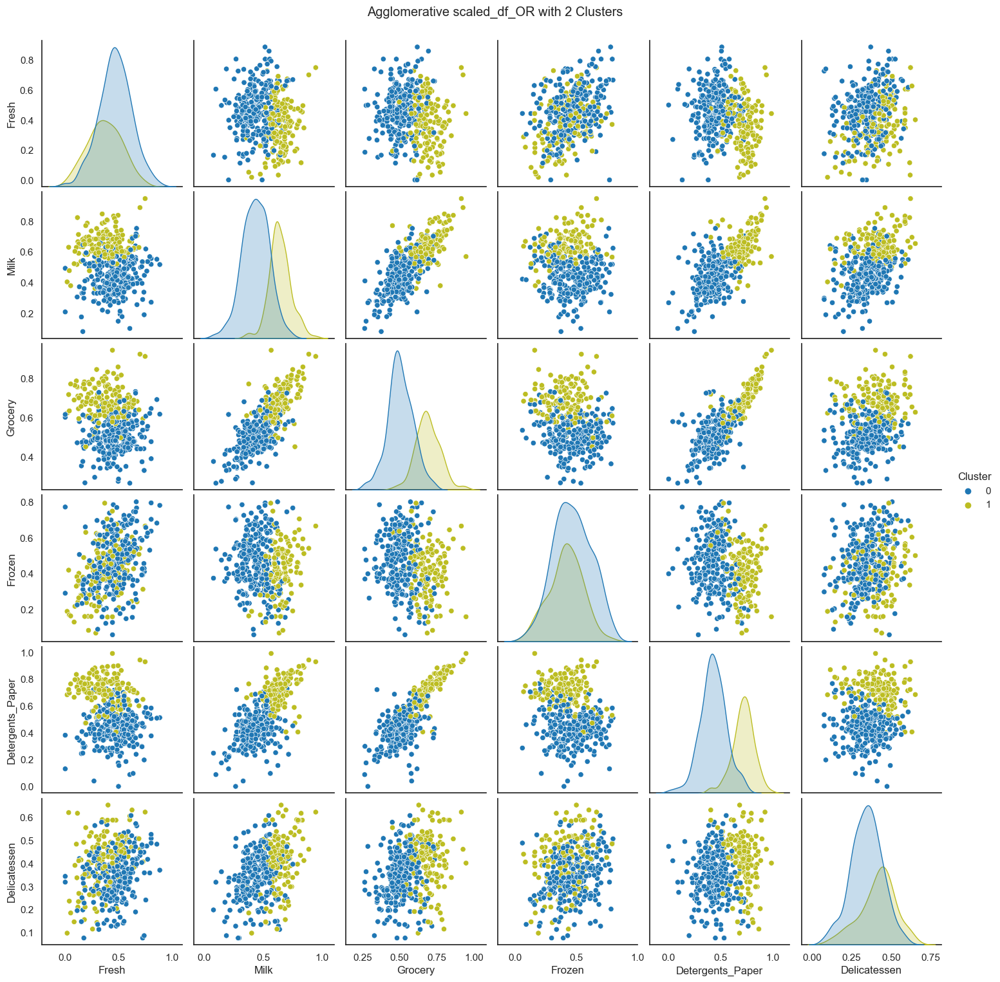

In [338]:
set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[0], set_palette[8]]
sns.pairplot(ward2_df_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('Agglomerative scaled_df_OR with 2 Clusters', y=1.02, ha='center') 
plt.show()

#### 3 Clusters

In [214]:
#SEtting up model for Ward method with 3 clusters
ac_3 = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters = 3)
ward_3 = ac_3.fit_predict(scaled_df)

In [215]:
ward3_df = scaled_df.copy()
ward3_df['Cluster']=ward_3

Plotting clusters for Ward Method with 3 Clusters for scaled_df

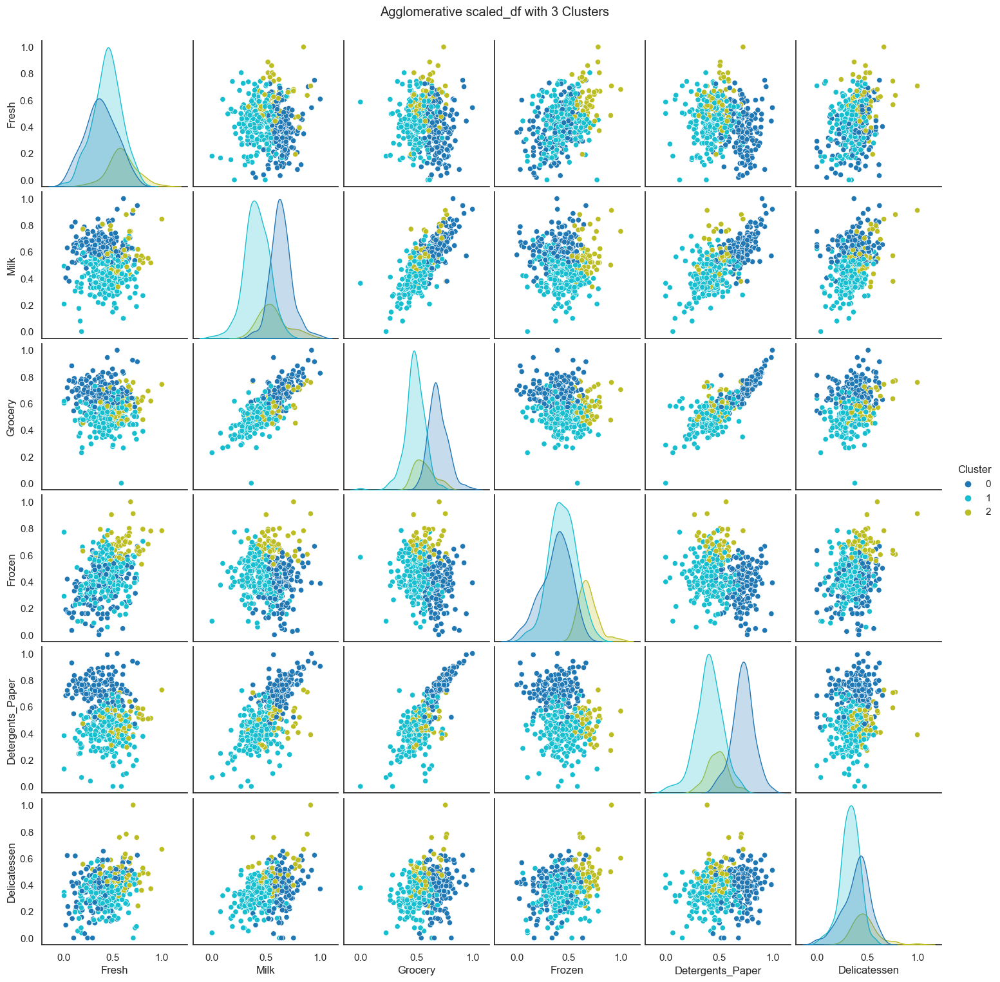

In [339]:
set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[0], set_palette[9], set_palette[8]]
sns.pairplot(ward3_df, hue='Cluster', palette=custom_palette)
plt.suptitle('Agglomerative scaled_df with 3 Clusters', y=1.02, ha='center') 
plt.show()

In [228]:
#Setting up model for Ward method with 3 clusters for scaled_df_OR
ac_3 = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters = 3)
ward_3_OR = ac_3.fit_predict(scaled_df_OR)

In [229]:
ward3_df_OR = scaled_df_OR.copy()
ward3_df_OR['Cluster']=ward_3_OR

Plotting clusters for Ward Method with 3 Clusters for scaled_df_OR

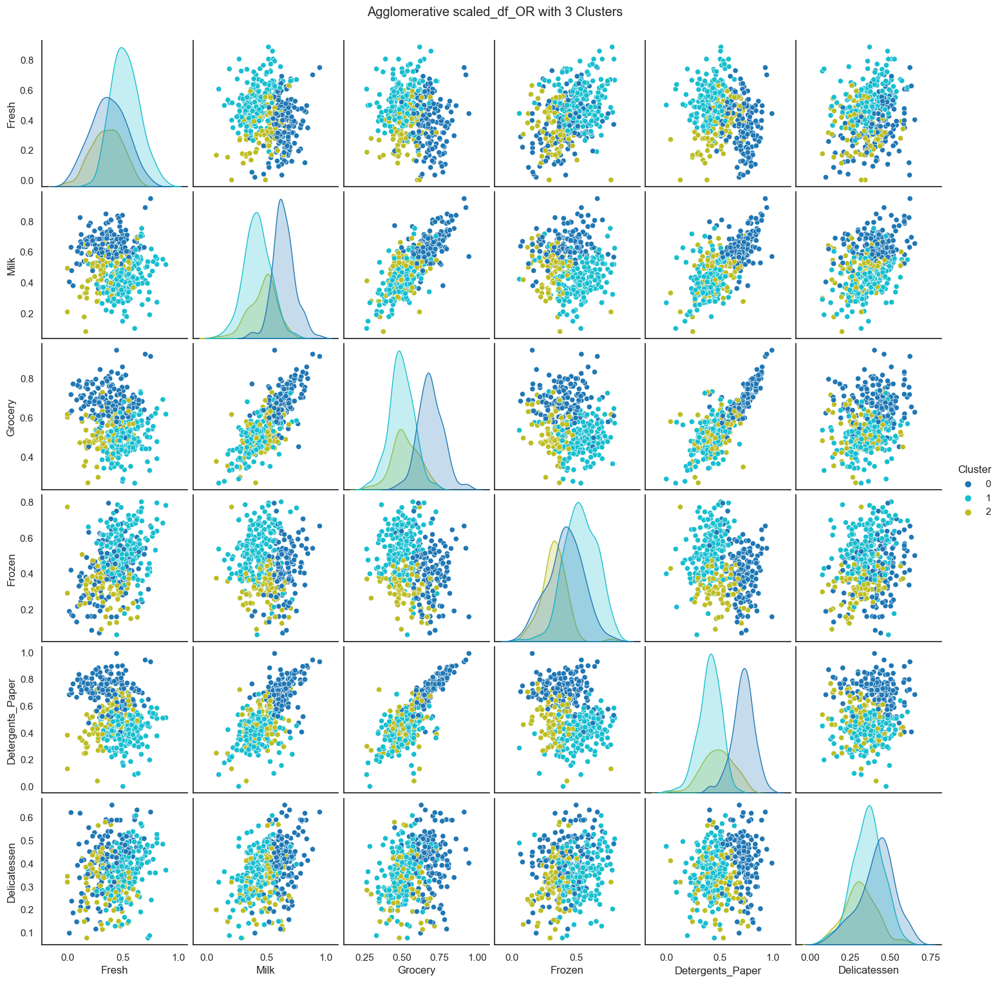

In [340]:
set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[0], set_palette[9], set_palette[8]]
sns.pairplot(ward3_df_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('Agglomerative scaled_df_OR with 3 Clusters', y=1.02, ha='center') 
plt.show()

I'm a little surprised at the outcome of all the plots. I really didn't expect the 3 clusters to look so messy. The plots with only 2 grouping seem to be more clearly separated than the 3 clusters and the KMeams appears to be doing a better job on both data sets.

# Part IV - PCA

In this section you are going to perform principal component analysis (PCA) to draw conclusions about the underlying structure of the wholesale customer data. Since using PCA on a dataset calculates the dimensions which best maximize variance, we will find which compound combinations of features best describe customers.

#### scaled_df

In [232]:
# Feature selection model with PCA for scaled_df
from sklearn.decomposition import PCA 
sns.set_style('whitegrid')

pca = PCA(n_components=6)
pca_d = pca.fit(scaled_df)
pca_d.explained_variance_ratio_

array([0.46005791, 0.27937954, 0.11015012, 0.07907588, 0.04961536,
       0.02172117])

In [233]:
pca_d.explained_variance_ratio_.cumsum()

array([0.46005791, 0.73943746, 0.84958758, 0.92866347, 0.97827883,
       1.        ])

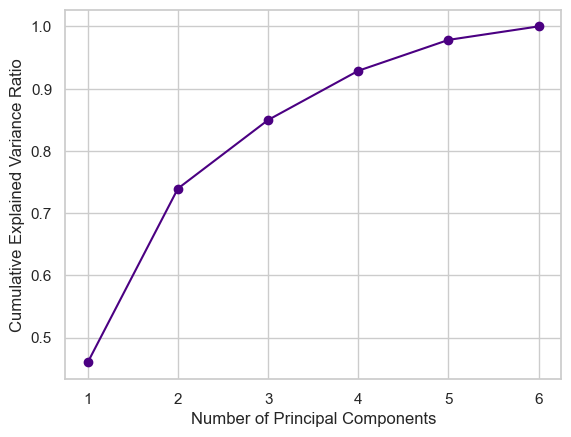

In [234]:
cumulative_variance_ratio = pca_d.explained_variance_ratio_.cumsum()

plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', color='indigo')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.show()

#### scaled_df_OR

In [236]:
pca = PCA(n_components=6)
pca_d_OR = pca.fit(scaled_df_OR)
pca_d_OR.explained_variance_ratio_

array([0.47812047, 0.256694  , 0.11689901, 0.08207158, 0.04407116,
       0.02214378])

In [237]:
pca_d_OR.explained_variance_ratio_.cumsum()

array([0.47812047, 0.73481447, 0.85171348, 0.93378506, 0.97785622,
       1.        ])

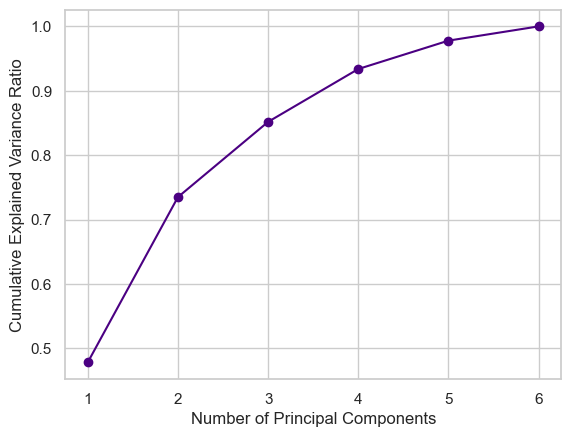

In [238]:
cumulative_variance_ratio_OR = pca_d_OR.explained_variance_ratio_.cumsum()

plt.plot(range(1, len(cumulative_variance_ratio_OR) + 1), cumulative_variance_ratio_OR, marker='o', color='indigo')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.show()

We can see the 'Cumulative Explained Variance Ratio' from the above graphs and numbersfor both data sets. If we were looking to reduce the dimentionality of our data we can see from this that we can already explain 85% of the total variance with only the first three components, and 93% with four components. This gives an indication of how to effectively reduce dimensionality and improve computation efficiency when dealing with high-dimension data sets. The graph and numbers for the data_set with no outliers is very close to the original data.

From here we can see what some of our previous models would be if we reduced our components to 4 for the 93% coverage.

### PCA and KMeans: 4 components

In [239]:
#running pca to reduce to 4 features for scaled_df
pca_4 = PCA(n_components=4)
pca_data = pca_4.fit_transform(scaled_df)

In [240]:
#running pca to reduce to 4 features for scaled_df_OR
pca_4 = PCA(n_components=4)
pca_data_OR = pca_4.fit_transform(scaled_df_OR)

#### 2 Clusters

In [241]:
#applying new pca reduced data to our 2 cluster KMeans model km_2 for both data sets

pca_km2 = km_2.fit_predict(pca_data)
pca_km2_OR = km_2.fit_predict(pca_data_OR)

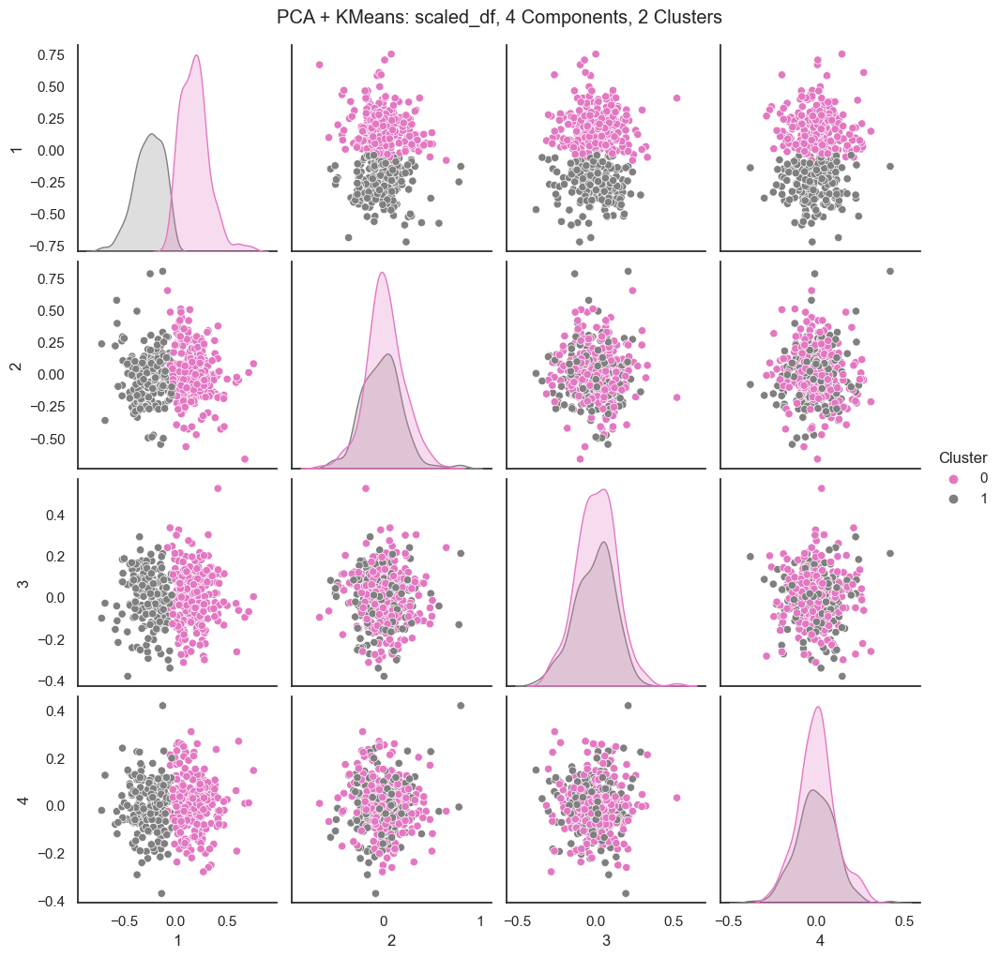

In [341]:
clusters_pca_km2 = pd.DataFrame(pca_data, columns=['1', '2', '3', '4'])
clusters_pca_km2['Cluster'] = pca_km2

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[6], set_palette[7]]
sns.pairplot(clusters_pca_km2, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + KMeans: scaled_df, 4 Components, 2 Clusters', y=1.02, ha='center') 
plt.show()

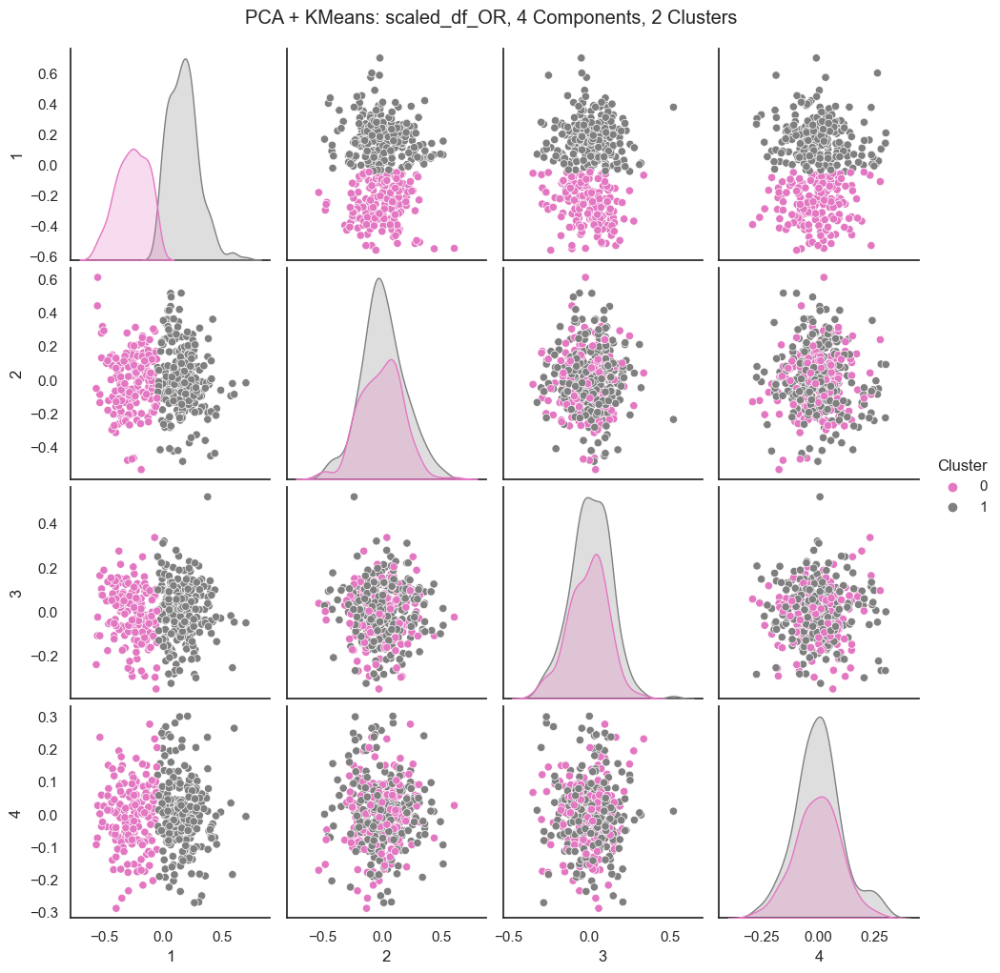

In [342]:
clusters_pca_km2_OR = pd.DataFrame(pca_data_OR, columns=['1', '2', '3', '4'])
clusters_pca_km2_OR['Cluster'] = pca_km2_OR

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[6], set_palette[7]]
sns.pairplot(clusters_pca_km2_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + KMeans: scaled_df_OR, 4 Components, 2 Clusters', y=1.02, ha='center') 
plt.show()

Some very clear divisions can be seen for all combinations of component 1 with 2 clusters.

#### 3 Clusters

In [254]:
#applying new pca reduced data to our 3 cluster KMeans model km_3 for both data sets

pca_km3 = km_3.fit_predict(pca_data)
pca_km3_OR = km_3.fit_predict(pca_data_OR)

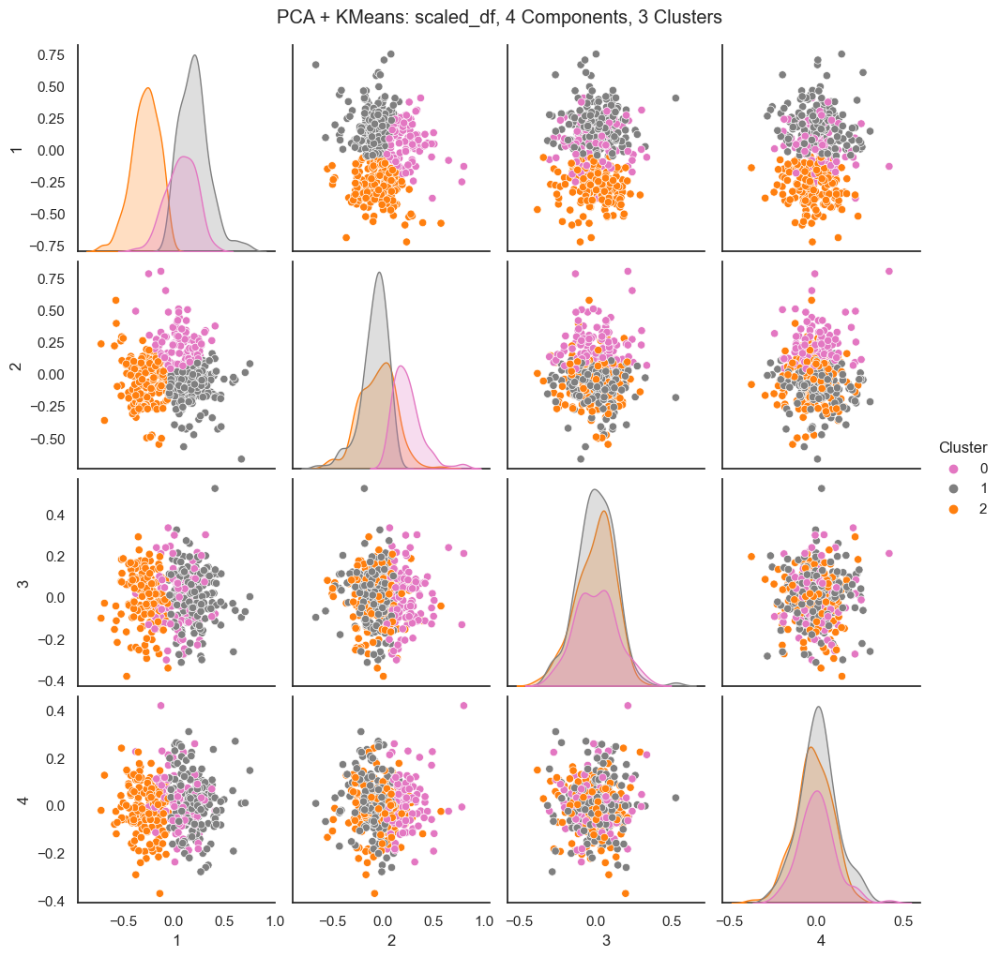

In [343]:
clusters_pca_km3 = pd.DataFrame(pca_data, columns=['1', '2', '3', '4'])
clusters_pca_km3['Cluster'] = pca_km3

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[6], set_palette[7], set_palette[1]]
sns.pairplot(clusters_pca_km3, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + KMeans: scaled_df, 4 Components, 3 Clusters', y=1.02, ha='center')
plt.show()


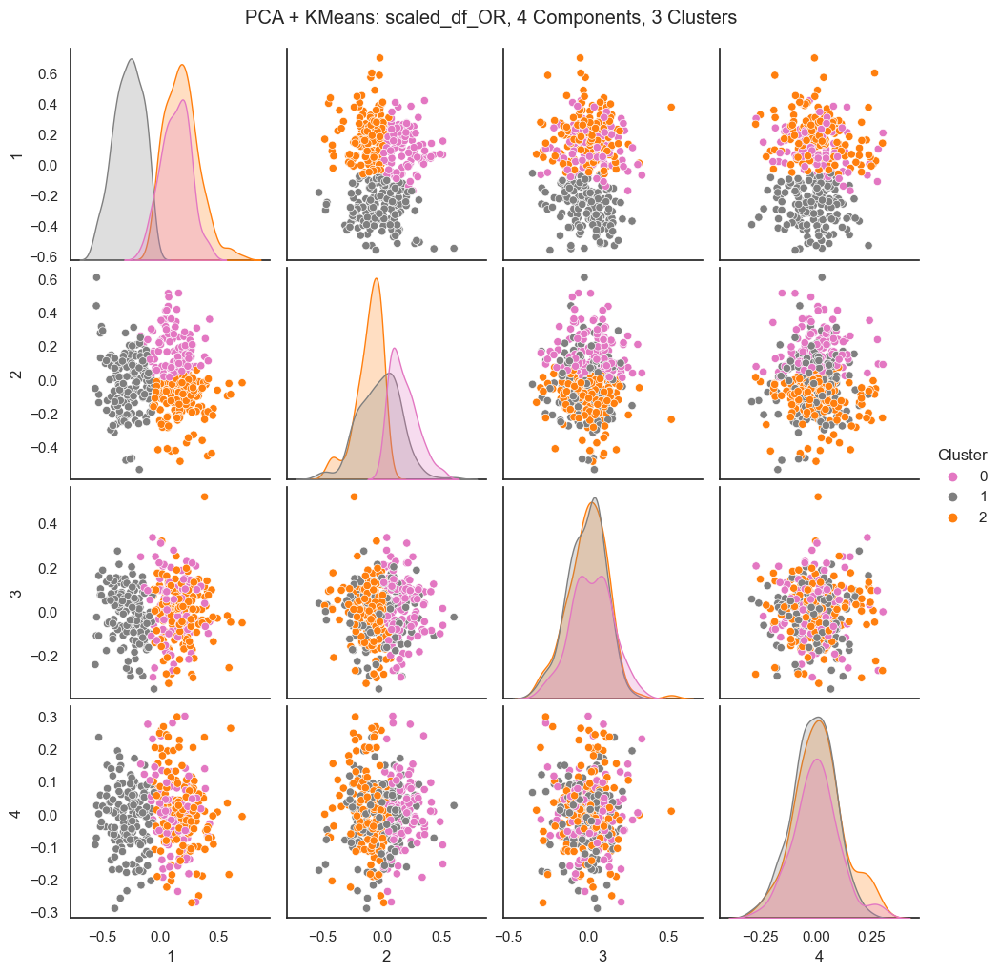

In [350]:
clusters_pca_km3_OR = pd.DataFrame(pca_data_OR, columns=['1', '2', '3', '4'])
clusters_pca_km3_OR['Cluster'] = pca_km3_OR

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[6], set_palette[7], set_palette[1]]
sns.pairplot(clusters_pca_km3_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + KMeans: scaled_df_OR, 4 Components, 3 Clusters', y=1.02, ha='center')
plt.show()


Some clear divisions between component 1 and 2, but the rest is pretty messy.

### PCA and Aglommerative Clustering

#### 2 Clusters

In [260]:
#appling our pca data to out s cluster Aglommerative model ac_2 for both data sets

pca_ac2 = ac_2.fit_predict(pca_data)
pca_ac2_OR = ac_2.fit_predict(pca_data_OR)

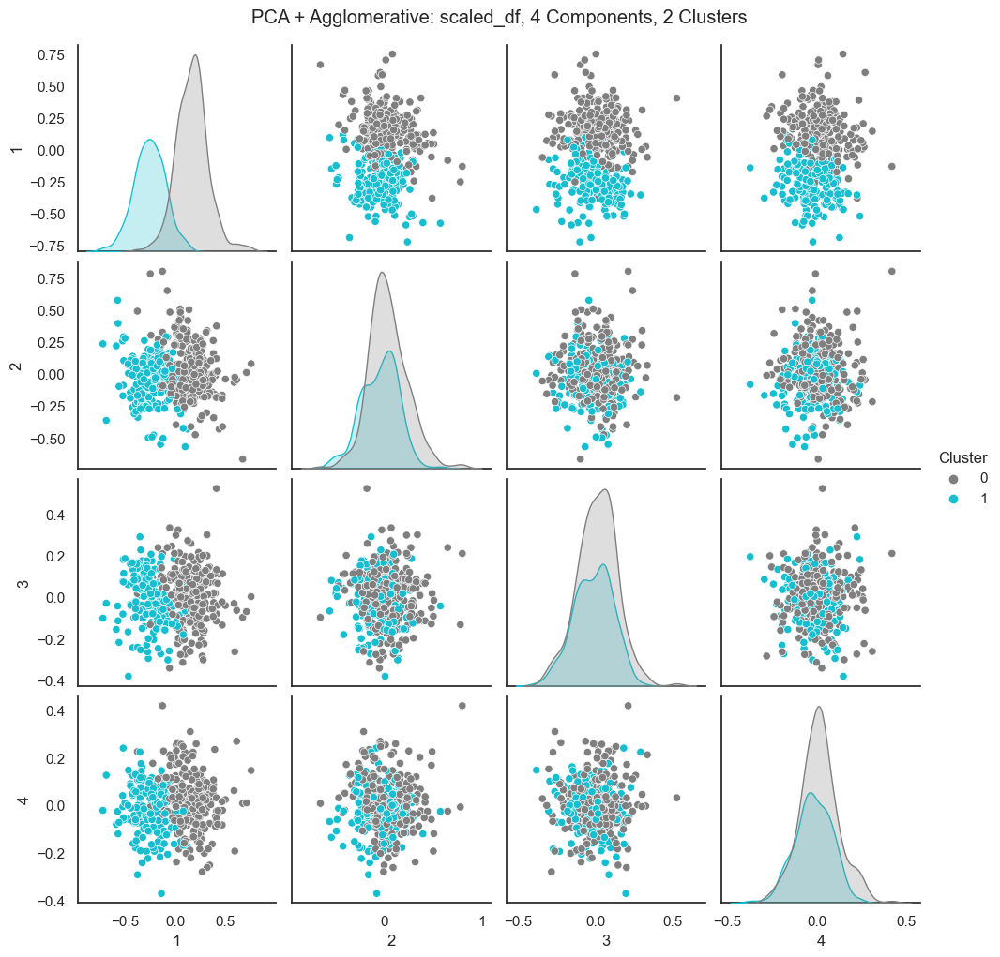

In [349]:
clusters_pca_ac2 = pd.DataFrame(pca_data, columns=['1', '2', '3', '4'])
clusters_pca_ac2['Cluster'] = pca_ac2

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[7], set_palette[9]]
sns.pairplot(clusters_pca_ac2, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + Agglomerative: scaled_df, 4 Components, 2 Clusters', y=1.02, ha='center')
plt.show()



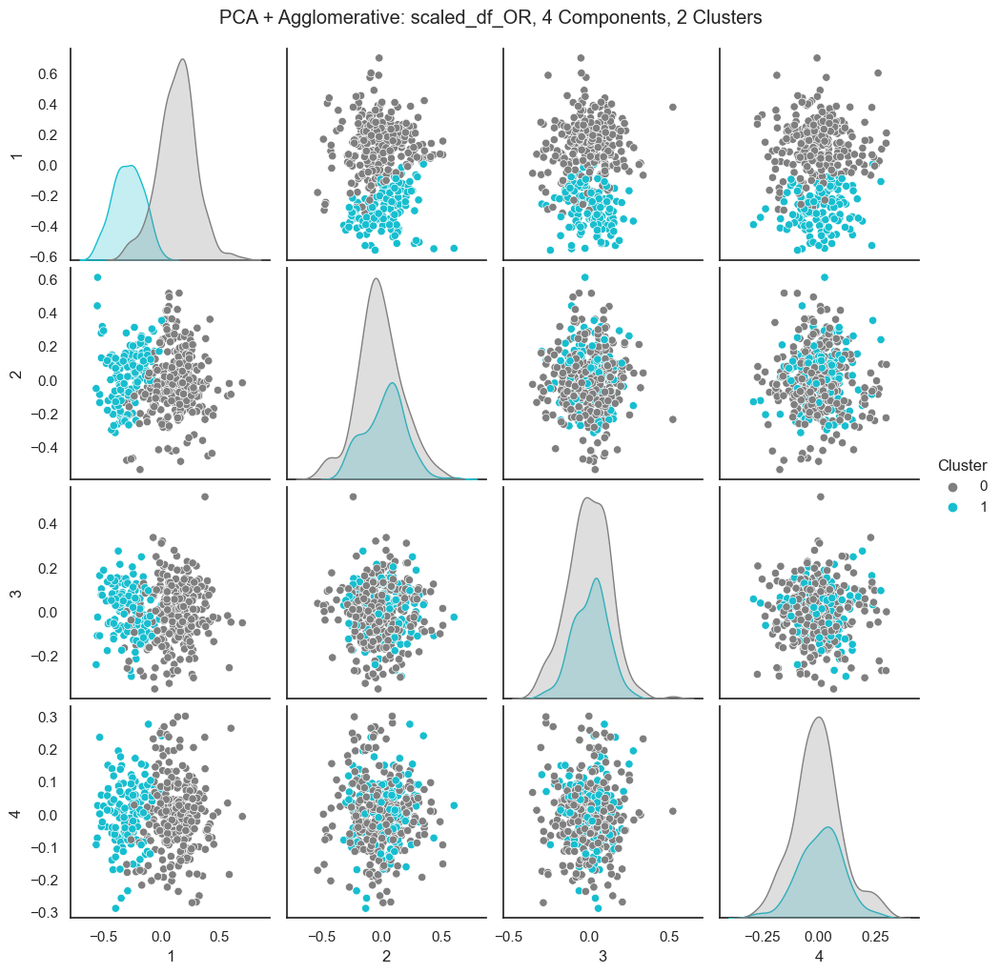

In [351]:
clusters_pca_ac2_OR = pd.DataFrame(pca_data_OR, columns=['1', '2', '3', '4'])
clusters_pca_ac2_OR['Cluster'] = pca_ac2_OR

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[7], set_palette[9]]
sns.pairplot(clusters_pca_ac2_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + Agglomerative: scaled_df_OR, 4 Components, 2 Clusters', y=1.02, ha='center')
plt.show()

3 Clusters

In [264]:
#appling our pca data to our 3 cluster Aglommerative model ac_3 for both data sets

pca_ac3 = ac_3.fit_predict(pca_data)
pca_ac3_OR = ac_3.fit_predict(pca_data_OR)

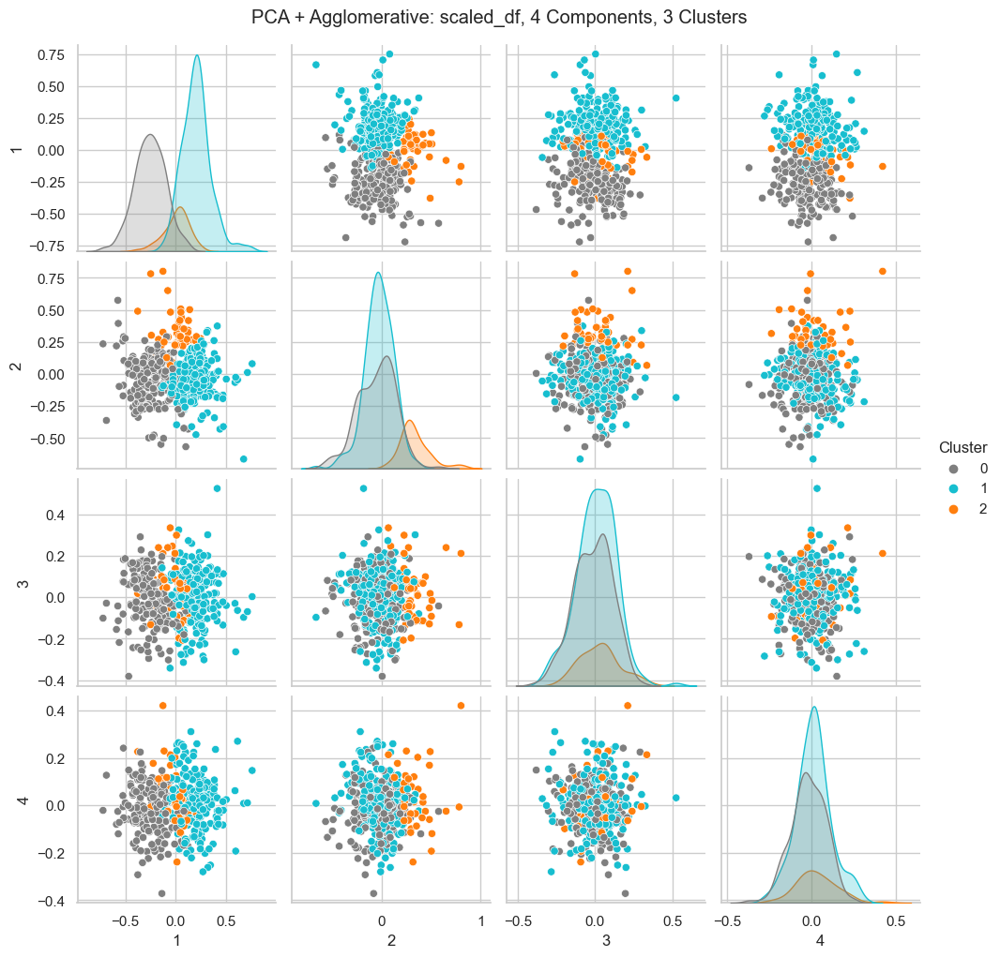

In [310]:
clusters_pca_ac3 = pd.DataFrame(pca_data, columns=['1', '2', '3', '4'])
clusters_pca_ac3['Cluster'] = pca_ac3

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[7], set_palette[9], set_palette[1]]
sns.pairplot(clusters_pca_ac3, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + Agglomerative: scaled_df, 4 Components, 3 Clusters', y=1.02, ha='center')
plt.show()

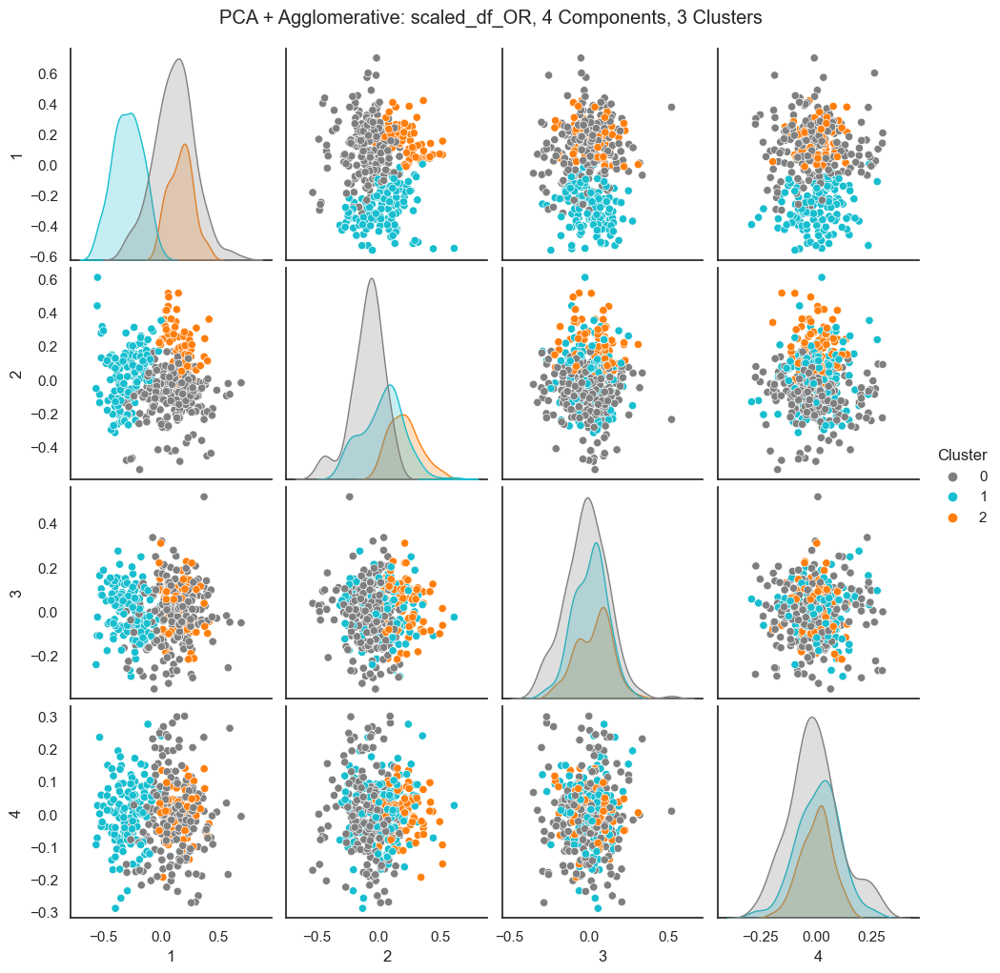

In [352]:
clusters_pca_ac3_OR = pd.DataFrame(pca_data_OR, columns=['1', '2', '3', '4'])
clusters_pca_ac3_OR['Cluster'] = pca_ac3_OR

set_palette = sns.color_palette("tab10", 10)
custom_palette = [set_palette[7], set_palette[9], set_palette[1]]
sns.pairplot(clusters_pca_ac3_OR, hue='Cluster', palette=custom_palette)
plt.suptitle('PCA + Agglomerative: scaled_df_OR, 4 Components, 3 Clusters', y=1.02, ha='center')
plt.show()

Reducing the components does make some of the cluster arrangements look more distinct and others it seems to do nothing for. The reduction for KMeans appears to be clearer than the Agglomerative. You can see further separation, especially where component number 1 is involed, in comparison to our original models.

# Part V - Conclusion

From the model you developed and the exploratory data analysis (EDA) conducted, generate four bullet points as your findings.

- There are some noteable positive correlations between some of the features and only a very slight difference between the numbers for our original data set and the data set where the outliers were removed: \
    -Grocery and Detergents_Paper    0.818    0.818\
    -Milk and Grocery                0.777    0.777\
    -Milk and Detergents_Paper       0.685    0.693
    
- All models looked better with 2 clusters across the board. The KMeans model appears to edge out the Aglommerative model just slightly as the groupings look a little cleaner.

- 93% of the variability could still be explained when we reduced our model to 4 components.

- When looking at the sihouette scores, there is a small interesting peak at 6 variables on the chart. Is this because there are 6 original categories?


### Extra comparison images for funsies!

Here are a couple of images to directly compare the KMeans Clustering and Agglomerative Clustering plots side by side. Just in case you haven't seen enough of them already :)

<img src="images/2Cluster.png" alt="2 Cluster Models" style="width:1500px;height:1500px;">

<img src="images/3Cluster.png" alt="3 Cluster Models" style="width:1500px;height:1500px;">

<img src="images/2Cluster4.png" alt="2 Cluster Models 4 Components" style="width:1500px;height:1500px;">

<img src="images/3Cluster4.png" alt="3 Cluster Models 4 Components" style="width:1500px;height:1500px;">